In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
from matplotlib.pyplot import rc_context
import os
import seaborn as sns
import harmonypy as hm
import importlib
import re
import random

In [2]:
import scipy
from scipy.stats import ranksums

In [3]:
import degSummary

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white', dpi_save=600)

scanpy==1.8.2 anndata==0.7.5 umap==0.5.2 numpy==1.20.3 scipy==1.5.3 pandas==1.3.5 scikit-learn==1.0.1 statsmodels==0.12.2 python-igraph==0.9.8 pynndescent==0.5.5


# Load data

In [5]:
os.chdir('../../../..')

In [6]:
pwd

'/Users/tzuchiao/ProjectAnalysis/AFCA'

In [7]:
fcaDatasetFolder='../FCA/dataset'
fcaH5adFolder='../FCA/dataset/h5ad'
fcaLoomFolder='../FCA/dataset/loom'

In [8]:
harmonyAnalysisFolder=f'Analysis/4.harmony'

In [9]:
age_L=['5', '30', '50', '70']
ageColor_L=['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728']
dark2Color_L=["#1B9E77", "#D95F02", "#7570B3"]
set2Color_L=["#66C2A5", "#E9936A", "#A89BB0"]

In [10]:
allHeadBodyDataFolder=f'{harmonyAnalysisFolder}/afcaFca_headBody_v1.0/normalizedCounts' 

os.makedirs(allHeadBodyDataFolder, exist_ok=True)
allHeadBodyPicFolder=f'{allHeadBodyDataFolder}/pic'
os.makedirs(allHeadBodyPicFolder, exist_ok=True)

In [11]:
figureDataFolder=f'Analysis/Figure'
os.makedirs(figureDataFolder, exist_ok=True)

figure2DataFolder=f'{figureDataFolder}/Figure2'
os.makedirs(figure2DataFolder, exist_ok=True)

figure3DataFolder=f'{figureDataFolder}/Figure3'
os.makedirs(figure3DataFolder, exist_ok=True)

figure5Folder=f'{figureDataFolder}/Figure5'
os.makedirs(figure5Folder, exist_ok=True)
figure5PicFolder=f'{figure5Folder}/pic'
os.makedirs(figure5PicFolder, exist_ok=True)

In [12]:
markerFolder=f'{figure5Folder}/marker'
os.makedirs(markerFolder, exist_ok=True)

In [13]:
color_L=sns.color_palette("coolwarm", 7)[::3]
color_L=[color_L[0], color_L[2], color_L[1]]

# Cell identity

In [14]:
adata_head=sc.read(f'{allHeadBodyDataFolder}/adata_head_S_v1.0.h5ad')
adata_body=sc.read(f'{allHeadBodyDataFolder}/adata_body_S_v1.0.h5ad')

In [21]:
adata_headBody=sc.read(f'{allHeadBodyDataFolder}/adata_headBody_S_v1.0.h5ad')

In [16]:
markerFolder=f'{figure5Folder}/marker'
os.makedirs(markerFolder, exist_ok=True)

In [17]:
filtered_L = [x.strip() for x in open('Analysis/Figure/Figure3/agingFeature_cellTypeName_modified_selected.list')]

## Identify cell-type markers using age-specific adata

In [37]:
adata_head=sc.read(f'{allHeadBodyDataFolder}/adata_head_S_v1.0.h5ad')
adata_body=sc.read(f'{allHeadBodyDataFolder}/adata_body_S_v1.0.h5ad')

### Identify markers

In [38]:
for tissue in ['body', 'head']:
    if tissue == 'body': 
        
        adata = adata_body
    else: 
        
        adata = adata_head
    
    adata=adata[adata.obs.afca_annotation != 'unannotated']
    for age in age_L:
        adata_age = adata[adata.obs.age == age]
        
        # deg
        sc.tl.rank_genes_groups(adata_age, groupby='afca_annotation', method='wilcoxon')
        result = adata_age.uns['rank_genes_groups']
        groups = result['names'].dtype.names
        degDf =pd.DataFrame(
            {group + '_' + key: result[key][group]
            for group in groups for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']})

        degDf.to_csv(f'{markerFolder}/cellType_markers_{tissue}_{age}.csv', index=False)
        

ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:22)
ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:05)
ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:55)
ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:07)
ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:41)


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_g

ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:45)


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_ge

ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:07)
ranking genes


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:50)


### Extract top 200 markers from each 5d cell type

In [39]:
body_degDf = pd.read_csv(f'{markerFolder}/cellType_markers_body_5.csv')
head_degDf = pd.read_csv(f'{markerFolder}/cellType_markers_head_5.csv')

In [40]:
len(body_degDf.columns.to_list()[::4])

72

In [41]:
len(head_degDf.columns.to_list()[::4])

90

In [42]:
marker_Df = pd.DataFrame(columns=['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'annotation'])
marker_Df_fdr = pd.DataFrame(columns=['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'annotation'])

for tissue in ['body', 'head']:
    markerFile = f'{markerFolder}/cellType_markers_{tissue}_5.csv'
    
    if tissue == 'body': adata = adata_body
    else: adata = adata_head
    
    degLongDf, degLongDf_fdr = degSummary.markerSummary(markerFile)
    
    marker_Df=pd.concat([marker_Df, degLongDf])
    marker_Df_fdr=pd.concat([marker_Df_fdr, degLongDf_fdr])

cellType_L:  72
cellType_L:  90


In [43]:
top200names_Df = pd.DataFrame()

for tissue in ['body', 'head']:
    marker_Df = pd.read_csv(f'{markerFolder}/cellType_markers_{tissue}_5.csv')
    
    cellType_L=['_'.join(colName.split('_')[:-1]) for colName in marker_Df.columns.to_list()[::4]]
    
    cellType_Df = marker_Df.loc[:199, 
                                [f'{cellType}_names' for cellType in cellType_L]]
    print(cellType_Df.shape)
    
    if len(top200names_Df)==0: top200names_Df=cellType_Df
    else: top200names_Df = pd.concat([top200names_Df, cellType_Df], axis=1)
    
#     for cellType in cellType_L[:]:
#         top200_L = marker_Df.loc[:,f'{cellType}_names'].to_list()[:200]
#         # print(top200_L)
#         # print(len(top200_L))
        
#         top200_D[cellType] = 
        
top200names_Df

(200, 72)
(200, 90)


,16-cell germline cyst in germarium region 2a and 2b_names,CNS surface associated glial cell_names,adult Malpighian tubule principal cell_names,adult Malpighian tubule principal cell of initial segment_names,adult Malpighian tubule principal cell of lower segment_names,adult Malpighian tubule principal cell of lower ureter_names,adult Malpighian tubule stellate cell of main segment_names,adult alary muscle_names,adult differentiating enterocyte_names,adult fat body_body_names,...,transmedullary Y neuron TmY5a_names,transmedullary Y neuron TmY8_names,transmedullary neuron Tm1_names,transmedullary neuron Tm2_names,transmedullary neuron Tm20_names,transmedullary neuron Tm29_names,transmedullary neuron Tm3a_names,transmedullary neuron Tm4_names,transmedullary neuron Tm5c_names,transmedullary neuron Tm9_names
0,kirre,how,axo,Eip93F,ome,Chs2,Lkr,sls,mesh,apolpp,...,DIP-lambda,nAChRalpha6,Con,pdm3,bru3,nAChRalpha5,DIP-theta,side-III,side,CG45263
1,CG9650,CG8369,gish,lola,Fas2,CG4301,l(1)G0196,org-1,CG15347,Nplp2,...,beat-Ic,beat-IIIc,lncRNA:CR44997,Ca-alpha1T,beat-Ic,Rdl,Ten-a,Frq1,CG44153,Dscam4
2,lncRNA:CR44357,CG8086,Moe,baz,bru2,sob,lncRNA:CR42839,Mhc,CG30424,CaMKI,...,kn,vvl,CG31221,lncRNA:CR44997,DIP-zeta,Shab,CG4341,side-VI,klg,eys
3,lncRNA:CR44833,CG14445,fok,MESR3,Samuel,Damm,CG5697,wupA,CG13321,CG7470,...,beat-Ib,Vsx2,Rdl,KCNQ,SoxN,br,Cbp53E,CG42458,IA-2,pdm3
4,Marf1,CLIP-190,Gdap2,glec,klar,CG30424,Nha2,CG45076,CG2556,CG6503,...,Dscam2,Rdl,SLO2,CG42346,dpr13,nAChRalpha7,Rdl,CG42541,sm,mspo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,RpL6,ec,CG2556,CG32982,Alp4,CG30197,Atf6,sbb,lncRNA:CR32773,Sam-S,...,stai,CanA-14F,asRNA:CR44894,CG1909,Fili,tup,CG42613,nrv3,Rbfox1,Gprk1
196,inaE,E23,CG42360,Pde9,CG7084,CG7611,Trf2,AdSS,CG10660,olf186-M,...,mld,simj,Pdfr,Drak,cpx,arm,Ca-Ma2d,mub,D,SiaT
197,CG5953,mamo,CG12811,hid,Tmem63,Flo2,Fhos,Drat,Nmda1,Hnf4,...,CG17698,Cadps,inaE,Oamb,CadN,Jupiter,Nlg3,CG12163,MsR1,Tob
198,Dek,glec,Jwa,sima,Alr,Trf2,app,lncRNA:CR44997,Cam,Gs2,...,Haspin,SPR,nrv3,Nrx-1,MFS17,CG34393,RhoGAP102A,sdt,CG11155,side-VIII


In [44]:
top200names_Df.to_csv(f'{markerFolder}/top200names_5d.csv', index=False)

### Extract top 200 markers from each 50d cell type

In [45]:
body_degDf = pd.read_csv(f'{markerFolder}/cellType_markers_body_50.csv')
head_degDf = pd.read_csv(f'{markerFolder}/cellType_markers_head_50.csv')

In [46]:
len(body_degDf.columns.to_list()[::4])

71

In [47]:
len(head_degDf.columns.to_list()[::4])

90

In [48]:
marker_Df = pd.DataFrame(columns=['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'annotation'])
marker_Df_fdr = pd.DataFrame(columns=['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'annotation'])

for tissue in ['body', 'head']:
    markerFile = f'{markerFolder}/cellType_markers_{tissue}_50.csv'
    
    if tissue == 'body': adata = adata_body
    else: adata = adata_head
    
    degLongDf, degLongDf_fdr = degSummary.markerSummary(markerFile)
    
    marker_Df=pd.concat([marker_Df, degLongDf])
    marker_Df_fdr=pd.concat([marker_Df_fdr, degLongDf_fdr])

cellType_L:  71
cellType_L:  90


In [49]:
top200names_Df = pd.DataFrame()

for tissue in ['body', 'head']:
    marker_Df = pd.read_csv(f'{markerFolder}/cellType_markers_{tissue}_50.csv')
    
    cellType_L=['_'.join(colName.split('_')[:-1]) for colName in marker_Df.columns.to_list()[::4]]
    
    cellType_Df = marker_Df.loc[:199, 
                                [f'{cellType}_names' for cellType in cellType_L]]
    print(cellType_Df.shape)
    
    if len(top200names_Df)==0: top200names_Df=cellType_Df
    else: top200names_Df = pd.concat([top200names_Df, cellType_Df], axis=1)
    
#     for cellType in cellType_L[:]:
#         top200_L = marker_Df.loc[:,f'{cellType}_names'].to_list()[:200]
#         # print(top200_L)
#         # print(len(top200_L))
        
#         top200_D[cellType] = 
        
top200names_Df

(200, 71)
(200, 90)


,16-cell germline cyst in germarium region 2a and 2b_names,CNS surface associated glial cell_names,adult Malpighian tubule principal cell_names,adult Malpighian tubule principal cell of initial segment_names,adult Malpighian tubule principal cell of lower segment_names,adult Malpighian tubule principal cell of lower ureter_names,adult Malpighian tubule stellate cell of main segment_names,adult alary muscle_names,adult fat body_body_names,adult glial cell_names,...,transmedullary Y neuron TmY5a_names,transmedullary Y neuron TmY8_names,transmedullary neuron Tm1_names,transmedullary neuron Tm2_names,transmedullary neuron Tm20_names,transmedullary neuron Tm29_names,transmedullary neuron Tm3a_names,transmedullary neuron Tm4_names,transmedullary neuron Tm5c_names,transmedullary neuron Tm9_names
0,kirre,how,CG3168,osa,cad,Mur29B,Lkr,bt,apolpp,MESK2,...,beat-Ic,nAChRalpha6,CG31221,KCNQ,bru3,nAChRalpha5,DIP-theta,CG31221,side,Dscam4
1,lncRNA:CR44357,CG5687,CG15406,rut,MYPT-75D,CG10911,tsh,up,CG4716,ct,...,DIP-lambda,beat-IIIc,Pde1c,pdm3,beat-Ic,nAChRalpha7,Ten-a,side-III,klg,eys
2,lncRNA:CR44833,sens-2,CG7084,CG34347,Ndae1,CG4301,CG13323,org-1,CG17124,S,...,kn,Dscam2,Con,Ca-alpha1T,DIP-zeta,Shab,CG4341,side-VI,CG44153,CG45263
3,CG9650,cv-c,Fas2,Ir40a,CG2556,cdi,CG34043,sls,Nplp2,Atpalpha,...,beat-Ib,Rdl,lncRNA:CR44997,lncRNA:CR44997,beat-Ib,Rdl,Rdl,CG42458,nAChRalpha5,mspo
4,lncRNA:CR32773,CLIP-190,l(1)G0196,Myo81F,bru2,CG2556,l(1)G0196,CG1674,CG7470,Rbfox1,...,Dscam2,CG17684,SLO2,Nckx30C,SoxN,Syt1,scro,Frq1,Stacl,pdm3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,GlcAT-P,CG3009,ArfGAP1,Cdep,Gclm,CG9568,Shrm,Sh3beta,santa-maria,CG14441,...,tty,Cadps,Alk,CG43347,CG12531,CG13506,nAChRalpha5,spri,Epac,fs(1)h
196,MYPT-75D,GstS1,4E-T,Top1,CG14441,CG8249,GEFmeso,Timp,CG1213,Mgat2,...,Rbp,smog,CG43347,Tob,nrv3,Ca-alpha1D,MsR1,trn,miple1,Rbp
197,RpL8,CG43897,CG12825,Gprk2,CG42663,CG5096,emb,Tret1-1,pre-rRNA:CR45845,sr,...,qvr,Mid1,Syt4,Fs,CG17716,lncRNA:CR43126,Hs3st-A,eag,CG12994,stj
198,RpL7A,bol,pygo,chic,flfl,CG32633,hid,lncRNA:let7C,aralar1,Baldspot,...,kcc,Nckx30C,Lar,ftz-f1,DIP-kappa,sns,CG43347,CG13685,X11Lbeta,CG11000


In [50]:
top200names_Df.to_csv(f'{markerFolder}/top200names_50d.csv', index=False)

## Check top 200 5d markers in the aging population

In [39]:
top200names_Df=pd.read_csv(f'{markerFolder}/top200names_5d.csv')
top200names_Df

,16-cell germline cyst in germarium region 2a and 2b_names,CNS surface associated glial cell_names,adult Malpighian tubule principal cell_names,adult Malpighian tubule principal cell of initial segment_names,adult Malpighian tubule principal cell of lower segment_names,adult Malpighian tubule principal cell of lower ureter_names,adult Malpighian tubule stellate cell of main segment_names,adult alary muscle_names,adult differentiating enterocyte_names,adult fat body_body_names,...,transmedullary Y neuron TmY5a_names,transmedullary Y neuron TmY8_names,transmedullary neuron Tm1_names,transmedullary neuron Tm2_names,transmedullary neuron Tm20_names,transmedullary neuron Tm29_names,transmedullary neuron Tm3a_names,transmedullary neuron Tm4_names,transmedullary neuron Tm5c_names,transmedullary neuron Tm9_names
0,kirre,how,axo,Eip93F,ome,Chs2,Lkr,sls,mesh,apolpp,...,DIP-lambda,nAChRalpha6,Con,pdm3,bru3,nAChRalpha5,DIP-theta,side-III,side,CG45263
1,CG9650,CG8369,gish,lola,Fas2,CG4301,l(1)G0196,org-1,CG15347,Nplp2,...,beat-Ic,beat-IIIc,lncRNA:CR44997,Ca-alpha1T,beat-Ic,Rdl,Ten-a,Frq1,CG44153,Dscam4
2,lncRNA:CR44357,CG8086,Moe,baz,bru2,sob,lncRNA:CR42839,Mhc,CG30424,CaMKI,...,kn,vvl,CG31221,lncRNA:CR44997,DIP-zeta,Shab,CG4341,side-VI,klg,eys
3,lncRNA:CR44833,CG14445,fok,MESR3,Samuel,Damm,CG5697,wupA,CG13321,CG7470,...,beat-Ib,Vsx2,Rdl,KCNQ,SoxN,br,Cbp53E,CG42458,IA-2,pdm3
4,Marf1,CLIP-190,Gdap2,glec,klar,CG30424,Nha2,CG45076,CG2556,CG6503,...,Dscam2,Rdl,SLO2,CG42346,dpr13,nAChRalpha7,Rdl,CG42541,sm,mspo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,RpL6,ec,CG2556,CG32982,Alp4,CG30197,Atf6,sbb,lncRNA:CR32773,Sam-S,...,stai,CanA-14F,asRNA:CR44894,CG1909,Fili,tup,CG42613,nrv3,Rbfox1,Gprk1
196,inaE,E23,CG42360,Pde9,CG7084,CG7611,Trf2,AdSS,CG10660,olf186-M,...,mld,simj,Pdfr,Drak,cpx,arm,Ca-Ma2d,mub,D,SiaT
197,CG5953,mamo,CG12811,hid,Tmem63,Flo2,Fhos,Drat,Nmda1,Hnf4,...,CG17698,Cadps,inaE,Oamb,CadN,Jupiter,Nlg3,CG12163,MsR1,Tob
198,Dek,glec,Jwa,sima,Alr,Trf2,app,lncRNA:CR44997,Cam,Gs2,...,Haspin,SPR,nrv3,Nrx-1,MFS17,CG34393,RhoGAP102A,sdt,CG11155,side-VIII


In [40]:
markerDE_Df=pd.DataFrame()

for i, cellType in enumerate( [x.split('_names')[0] for x in top200names_Df.columns[:]] ):
    marker_L=top200names_Df.iloc[:,i].to_list()
    
    cellTypeFileName=cellType.replace('/', '_')
    degFile=f'{figure3DataFolder}/ageDEG_compare5d/{cellTypeFileName}_compareTo5d_allPairs.csv'
    try:
        geneSummaryDf, geneSummaryFdrDf = degSummary.degSummary(degFile, cellType, age_L[1:], marker_L)
    except: continue
    
    # print(geneSummaryDf.head())
    geneSummaryDf_50d = geneSummaryDf[geneSummaryDf.age == '50']
    print(cellType, len(geneSummaryDf_50d))
    
    if len(markerDE_Df) == 0: markerDE_Df=geneSummaryDf
    else: markerDE_Df = pd.concat([markerDE_Df, geneSummaryDf])
    

16-cell germline cyst in germarium region 2a and 2b 200
CNS surface associated glial cell 200
adult Malpighian tubule principal cell 200
adult Malpighian tubule principal cell of initial segment 200
adult Malpighian tubule principal cell of lower segment 200
adult Malpighian tubule principal cell of lower ureter 200
adult Malpighian tubule stellate cell of main segment 200
adult alary muscle 200
adult differentiating enterocyte 200
adult fat body_body 200
adult glial cell 200
adult heart ventral longitudinal muscle 200
adult hindgut 200
adult midgut enterocyte 200
adult midgut-hindgut hybrid zone 200
adult oenocyte 200
adult peripheral nervous system 200
adult reticular neuropil associated glial cell_body 200
adult salivary gland 200
adult tracheal cell 200
adult ventral nervous system 200
anterior ejaculatory duct 200
antimicrobial peptide-producing cell 200
cardia (1) 200
cardia (2) 200
cardiomyocyte, working adult heart muscle (non-ostia) 200
cell body glial cell 200
copper cell 200

In [41]:
# markerDE_Df['padj_05'] = ['Significant' if x <= 0.05 else 'Non-significant' for x in markerDE_Df.pvals_adj]

markerDE_Df.reset_index(drop=True, inplace=True)
padj_05_L=[]
for i, adj in enumerate(markerDE_Df.pvals_adj):
    logFC = markerDE_Df.logfoldchanges[i]
    if adj <= 0.05:
        if logFC >0: padj_05_L.append('Increased')
        else: padj_05_L.append('Decreased')
    else: padj_05_L.append('Non-significant')

markerDE_Df['padj_05'] = pd.Categorical(padj_05_L)
markerDE_Df

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
0,RpL10Ab,1.954827e-23,1.563080e-19,-2.540619,16-cell germline cyst in germarium region 2a a...,70,Decreased
1,RpL32,7.860125e-22,2.513982e-18,-2.146934,16-cell germline cyst in germarium region 2a a...,70,Decreased
2,NFAT,2.283825e-21,9.130734e-18,-3.198993,16-cell germline cyst in germarium region 2a a...,30,Decreased
3,RpL11,9.003092e-21,2.399624e-17,-2.541745,16-cell germline cyst in germarium region 2a a...,70,Decreased
4,RpS7,3.728797e-20,7.453865e-17,-1.988201,16-cell germline cyst in germarium region 2a a...,70,Decreased
...,...,...,...,...,...,...,...
97195,CG42238,5.529941e-02,1.000000e+00,0.233386,transmedullary neuron Tm9,50,Non-significant
97196,CG13594,5.450835e-02,1.000000e+00,0.560825,transmedullary neuron Tm9,50,Non-significant
97197,SLO2,5.217217e-02,1.000000e+00,0.294024,transmedullary neuron Tm9,50,Non-significant
97198,CG34353,4.337551e-01,1.000000e+00,0.170689,transmedullary neuron Tm9,50,Non-significant


In [42]:
markerDE_Df_50d = markerDE_Df[(markerDE_Df.age == '50') & (markerDE_Df.annotation.isin(filtered_L))]
markerDE_Df_50d

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
4201,pre-rRNA:CR45845,2.359922e-95,3.773988e-91,-4.666124,adult alary muscle,50,Decreased
4220,dnc,3.343859e-29,4.113461e-26,0.952242,adult alary muscle,50,Increased
4227,pan,5.269394e-26,4.956950e-23,0.759848,adult alary muscle,50,Increased
4232,Msp300,8.830625e-23,6.419062e-20,-0.992480,adult alary muscle,50,Decreased
4233,REPTOR,2.057925e-22,1.371264e-19,1.499175,adult alary muscle,50,Increased
...,...,...,...,...,...,...,...
95395,Rdl,2.421995e-01,1.000000e+00,-0.124151,transmedullary neuron Tm3a,50,Non-significant
95396,dpr12,2.354856e-01,1.000000e+00,0.215234,transmedullary neuron Tm3a,50,Non-significant
95397,Tomosyn,2.348574e-01,1.000000e+00,0.039596,transmedullary neuron Tm3a,50,Non-significant
95398,Rbp,3.914079e-01,1.000000e+00,0.075265,transmedullary neuron Tm3a,50,Non-significant


In [43]:
summaryDf=pd.DataFrame(columns=['annotation', 'increase#', 'decrease#', 'nonSignificant#', 'total#'])

for cellType in filtered_L[:]:
    degDf = markerDE_Df_50d[markerDE_Df_50d.annotation == cellType]
    valueCount_S = degDf.padj_05.value_counts()
    
    # print(cellType)
    # print(degDf.padj_05.value_counts())
    # print()
    
    summaryDf.loc[cellType]=[cellType, valueCount_S['Increased'], valueCount_S['Decreased'], valueCount_S['Non-significant'], sum([valueCount_S['Increased'], valueCount_S['Decreased'], valueCount_S['Non-significant']])]

summaryDf['decreaseRatio'] = summaryDf['decrease#']/ summaryDf['total#']
summaryDf

,annotation,increase#,decrease#,nonSignificant#,total#,decreaseRatio
adult alary muscle,adult alary muscle,39,41,120,200,0.205
adult fat body_body,adult fat body_body,63,118,19,200,0.590
adult glial cell,adult glial cell,23,23,154,200,0.115
adult oenocyte,adult oenocyte,51,117,32,200,0.585
adult peripheral nervous system,adult peripheral nervous system,26,70,104,200,0.350
...,...,...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,85,71,44,200,0.355
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,52,37,111,200,0.185
transmedullary neuron Tm1,transmedullary neuron Tm1,45,69,86,200,0.345
transmedullary neuron Tm2,transmedullary neuron Tm2,39,69,92,200,0.345


In [56]:
summaryDf.to_csv(f'{markerFolder}/summaryDf_5d_50d_markerDecrease5d.csv', index=False)

In [57]:
summaryDf.sort_values(by='decrease#', inplace=True, ascending=False)

In [58]:
sns.color_palette("coolwarm", 7)

[(0.383662065772549, 0.5101834172862746, 0.9178306732313726),
 (0.5543118699137254, 0.6900970112156862, 0.9955155482352941),
 (0.724041371882353, 0.8149103926470588, 0.9756509706470589),
 (0.8674276350862745, 0.864376599772549, 0.8626024620196079),
 (0.9595176584705882, 0.7669728545098039, 0.6741447150392157),
 (0.9566532109764706, 0.598033822717647, 0.4773022923529412),
 (0.8653913329372549, 0.3711276720470588, 0.2957689564156863)]

In [59]:
color_L=sns.color_palette("coolwarm", 7)[::3]
color_L=[color_L[0], color_L[2], color_L[1]]

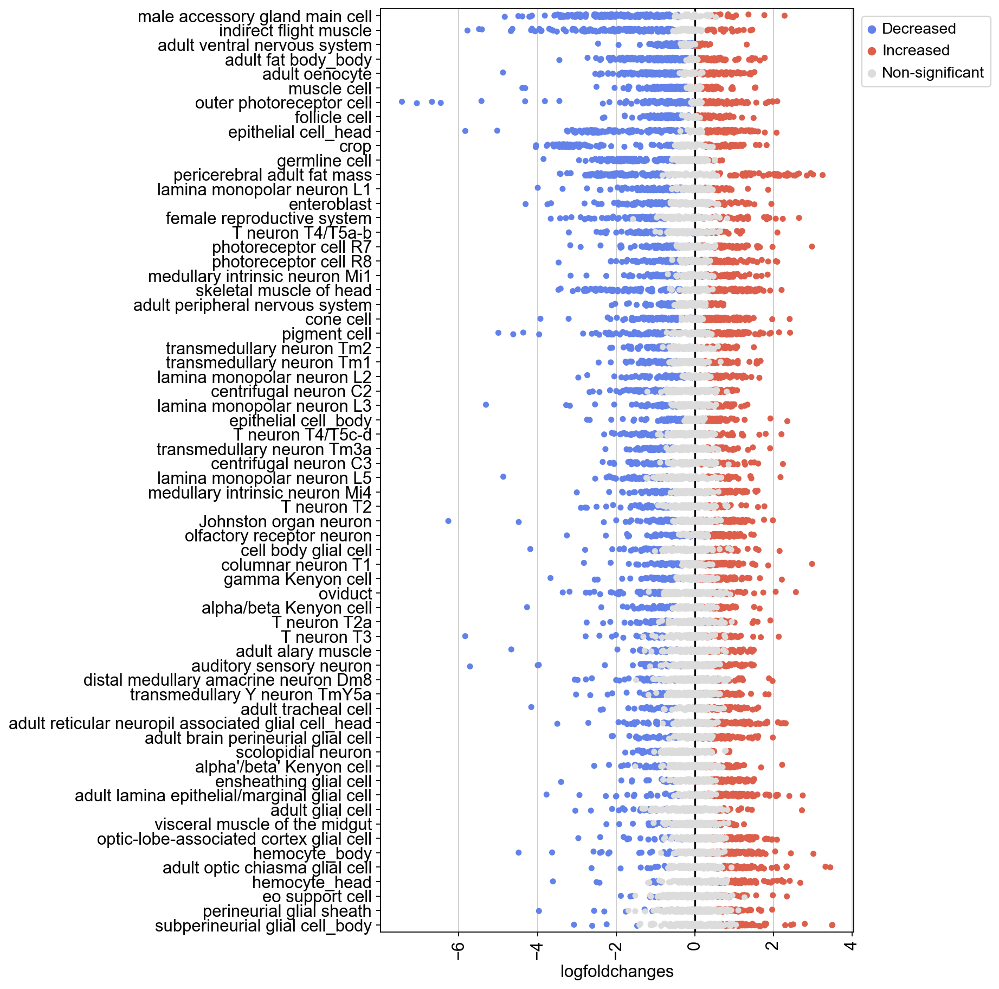

In [60]:
with rc_context({'figure.figsize': (7, 14)}): 
    ax=sns.stripplot(data=markerDE_Df_50d, x="logfoldchanges", y="annotation", order=summaryDf.index.to_list(), hue='padj_05', palette=color_L) #palette=['#2b83ba', '#d7191c', '#abdda4']  'coolwarm'
    plt.xticks(rotation=90)
    plt.axvline(0, color='black')
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.ylabel('')
    
    plt.savefig(f'{markerFolder}/cellType_identity.pdf', bbox_inches='tight')

In [61]:
markerDE_Df_50d['-log10_padj'] = -np.log10(markerDE_Df_50d['pvals_adj'])
markerDE_Df_50d

/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/pandas/core/arraylike.py:405: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_98603/4151087445.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  markerDE_Df_50d['-log10_padj'] = -np.log10(markerDE_Df_50d['pvals_adj'])


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
4201,pre-rRNA:CR45845,2.359922e-95,3.773988e-91,-4.666124,adult alary muscle,50,Decreased,90.423200
4220,dnc,3.343859e-29,4.113461e-26,0.952242,adult alary muscle,50,Increased,25.385793
4227,pan,5.269394e-26,4.956950e-23,0.759848,adult alary muscle,50,Increased,22.304785
4232,Msp300,8.830625e-23,6.419062e-20,-0.992480,adult alary muscle,50,Decreased,19.192528
4233,REPTOR,2.057925e-22,1.371264e-19,1.499175,adult alary muscle,50,Increased,18.862879
...,...,...,...,...,...,...,...,...
95395,Rdl,2.421995e-01,1.000000e+00,-0.124151,transmedullary neuron Tm3a,50,Non-significant,-0.000000
95396,dpr12,2.354856e-01,1.000000e+00,0.215234,transmedullary neuron Tm3a,50,Non-significant,-0.000000
95397,Tomosyn,2.348574e-01,1.000000e+00,0.039596,transmedullary neuron Tm3a,50,Non-significant,-0.000000
95398,Rbp,3.914079e-01,1.000000e+00,0.075265,transmedullary neuron Tm3a,50,Non-significant,-0.000000


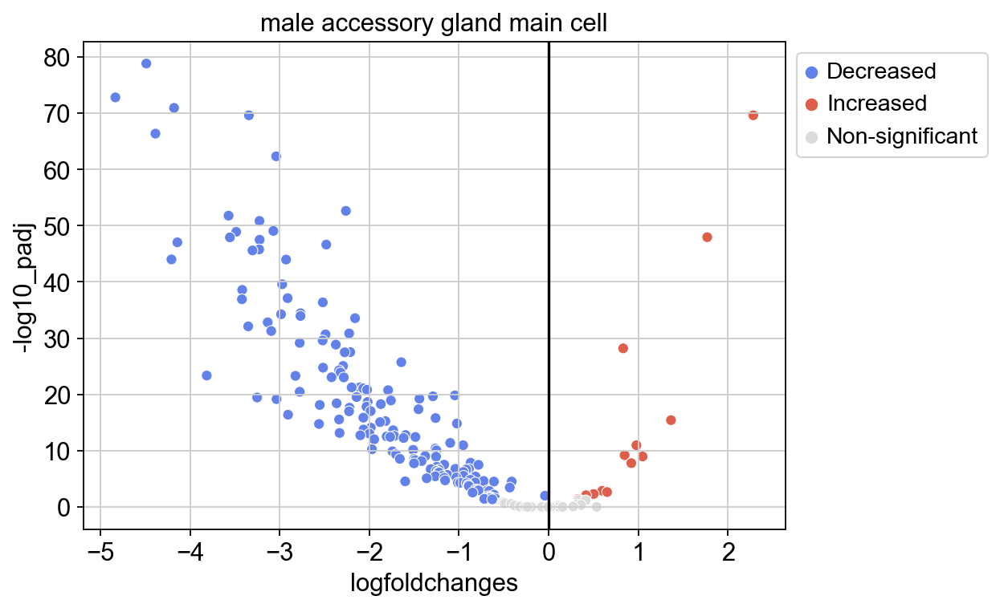

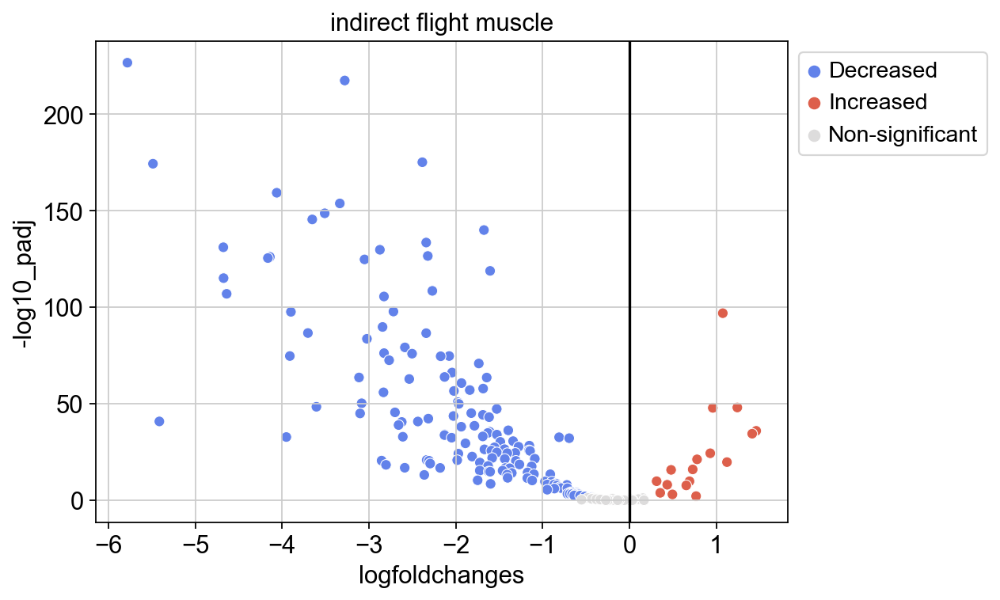

In [72]:
with rc_context({'figure.figsize': (7, 5)}): 
    ax=sns.scatterplot(data=markerDE_Df_50d[markerDE_Df_50d.annotation == 'male accessory gland main cell'], x='logfoldchanges', y='-log10_padj', hue='padj_05', palette=color_L)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.axvline(0, color='black')
    plt.title('male accessory gland main cell')
    plt.savefig(f'{markerFolder}/volcano_male accessory gland main cell_5d_50d.pdf')
    plt.show()
    
    ax=sns.scatterplot(data=markerDE_Df_50d[markerDE_Df_50d.annotation == 'indirect flight muscle'], x='logfoldchanges', y='-log10_padj', hue='padj_05', palette=color_L)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.axvline(0, color='black')
    plt.title('indirect flight muscle')
    plt.savefig(f'{markerFolder}/indirect flight muscle_5d_50d.pdf')
    plt.show()

In [73]:
markerDE_Df_50d[markerDE_Df_50d.annotation == 'indirect flight muscle'].head(50)

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
28233,mt:lrRNA,1.171144e-231,1.872893e-227,-5.780843,indirect flight muscle,50,Decreased,226.727487
28240,Wdr62,4.003947e-222,3.201556e-218,-3.277844,indirect flight muscle,50,Decreased,217.494639
28260,Glut4EF,1.339163e-179,7.138630e-176,-2.384318,indirect flight muscle,50,Decreased,175.146385
28261,mt:CoI,1.082840e-178,4.329193e-175,-5.486363,indirect flight muscle,50,Decreased,174.363593
28270,RpL41,1.799615e-163,4.796573e-160,-4.060979,indirect flight muscle,50,Decreased,159.319069
28273,Nc73EF,6.985331e-158,1.595849e-154,-3.334518,indirect flight muscle,50,Decreased,153.797008
28279,Nlg1,1.065068e-152,2.129072e-149,-3.508230,indirect flight muscle,50,Decreased,148.671810
28282,lncRNA:CR43334,1.761450e-149,3.129901e-146,-3.652091,indirect flight muscle,50,Decreased,145.504469
28284,Rbfox1,6.892895e-144,1.002102e-140,-1.674592,indirect flight muscle,50,Decreased,139.999088
28289,eEF1alpha1,2.238954e-137,2.983779e-134,-2.339835,indirect flight muscle,50,Decreased,133.525233


In [74]:
markerDE_Df_50d[markerDE_Df_50d.annotation == 'male accessory gland main cell'].head(50)

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
30001,Sfp96F,1.846017e-83,1.476075e-79,-4.487262,male accessory gland main cell,50,Decreased,78.830892
30004,Acp98AB,3.877306e-77,1.550147e-73,-4.831908,male accessory gland main cell,50,Decreased,72.809627
30006,Acp95EF,3.561106e-75,1.138984e-71,-4.177897,male accessory gland main cell,50,Decreased,70.943482
30007,Mst57Da,9.952030e-74,2.370256e-70,-3.342799,male accessory gland main cell,50,Decreased,69.625205
30008,mfas,1.037506e-73,2.370256e-70,2.281517,male accessory gland main cell,50,Increased,69.625205
30010,Mst57Db,2.149168e-70,4.296187e-67,-4.385313,male accessory gland main cell,50,Decreased,66.366917
30011,Acp53C14b,2.918575e-66,4.667385e-63,-3.039184,male accessory gland main cell,50,Decreased,62.330926
30019,BG642167,1.744148e-56,2.324368e-53,-2.261209,male accessory gland main cell,50,Decreased,52.633695
30020,CG43392,1.646342e-55,1.645519e-52,-3.569856,male accessory gland main cell,50,Decreased,51.783697
30022,Acp33A,1.711471e-54,1.440518e-51,-3.225071,male accessory gland main cell,50,Decreased,50.841481


In [268]:
markerDE_Df_50d[(markerDE_Df_50d.annotation == 'pericerebral adult fat mass') & (markerDE_Df_50d.padj_05 == 'Decreased')].head(50)

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
85237,RpLP2,3.57e-55,2.19e-52,-3.25,pericerebral adult fat mass,50,Decreased,51.66
85267,eEF1alpha1,2.43e-47,9.94e-45,-1.88,pericerebral adult fat mass,50,Decreased,44.00
85272,RpLP1,6.34e-47,2.47e-44,-2.78,pericerebral adult fat mass,50,Decreased,43.61
85292,RpL27A,2.87e-43,9.36e-41,-2.55,pericerebral adult fat mass,50,Decreased,40.03
85294,RpS18,5.34e-43,1.71e-40,-2.71,pericerebral adult fat mass,50,Decreased,39.77
85295,RpL7A,9.32e-43,2.88e-40,-2.39,pericerebral adult fat mass,50,Decreased,39.54
85300,sta,5.78e-42,1.68e-39,-2.67,pericerebral adult fat mass,50,Decreased,38.77
85303,RpS8,2.88e-41,8.08e-39,-2.46,pericerebral adult fat mass,50,Decreased,38.09
85305,RpS2,3.67e-41,1.01e-38,-2.72,pericerebral adult fat mass,50,Decreased,37.99
85324,RpL7,3.86e-38,9.49e-36,-2.57,pericerebral adult fat mass,50,Decreased,35.02


In [37]:
summaryDf=pd.read_csv(f'{markerFolder}/summaryDf_5d_50d_markerDecrease5d.csv')
summaryDf.index = summaryDf.annotation
summaryDf

,annotation,increase#,decrease#,nonSignificant#,total#,decreaseRatio
annotation,,,,,,
adult alary muscle,adult alary muscle,39,41,120,200,0.205
adult fat body_body,adult fat body_body,63,118,19,200,0.590
adult glial cell,adult glial cell,23,23,154,200,0.115
adult oenocyte,adult oenocyte,51,117,32,200,0.585
adult peripheral nervous system,adult peripheral nervous system,26,70,104,200,0.350
...,...,...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,85,71,44,200,0.355
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,52,37,111,200,0.185
transmedullary neuron Tm1,transmedullary neuron Tm1,45,69,86,200,0.345


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


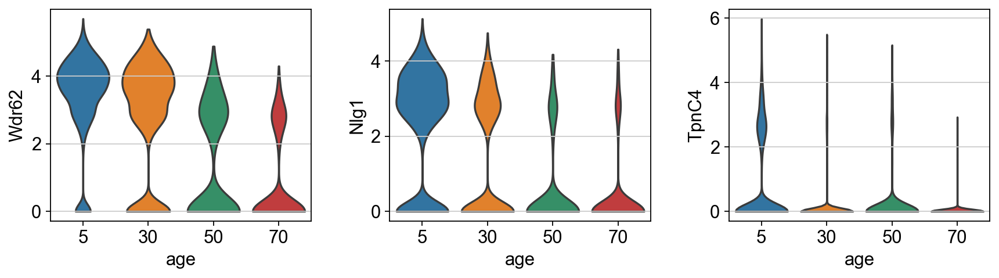

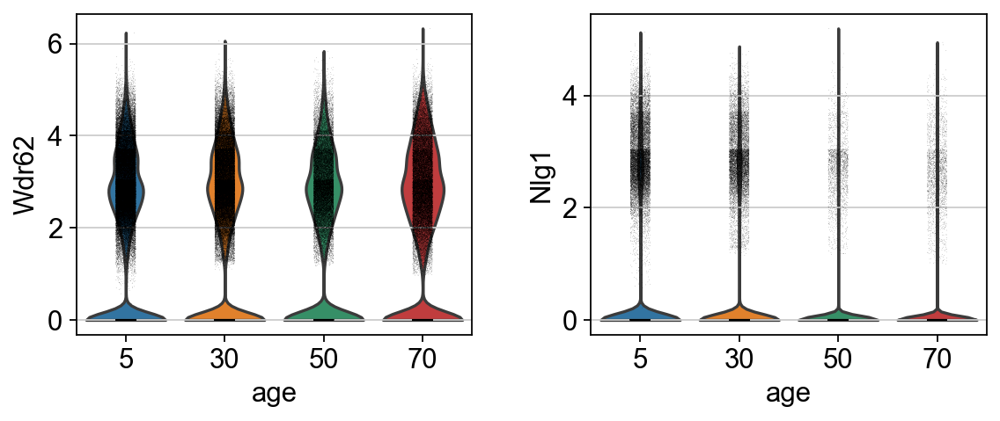

In [17]:
cellType='indirect flight muscle'
with rc_context({'figure.figsize': (4, 3)}): 
    sc.pl.violin(adata_body[adata_body.obs.afca_annotation == cellType], keys=['Wdr62', 'Nlg1', 'TpnC4'], groupby='age', save=f'_Wdr62_Nlg1_IFM.pdf', size=0)
    sc.pl.violin(adata_body, keys=['Wdr62', 'Nlg1'], groupby='age', size=0.2, save=f'_Wdr62_Nlg1_body.pdf')
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


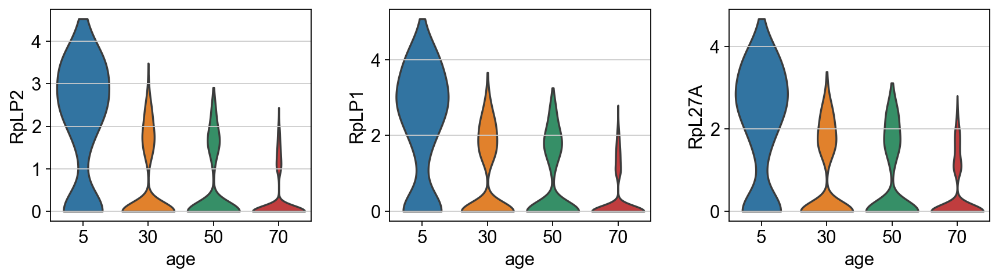

In [18]:
cellType='pericerebral adult fat mass'
with rc_context({'figure.figsize': (4, 3)}): 
    ax=sc.pl.violin(adata_head[adata_head.obs.afca_annotation == cellType], keys=['RpLP2', 'RpLP1', 'RpL27A'], groupby='age', show=False, size=0) # 
    # plt.grid(b=None)
    plt.savefig(f'{markerFolder}/violin_fatMass_RpLP2_RpLP1_RpL27A.pdf')
    plt.show()
    
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

In [45]:
markerDE_Df_50d[(markerDE_Df_50d.annotation == 'male accessory gland main cell') & (markerDE_Df_50d.padj_05 == 'Decreased')].head(50)

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
30001,Sfp96F,1.846017e-83,1.476075e-79,-4.487262,male accessory gland main cell,50,Decreased
30004,Acp98AB,3.877306e-77,1.550147e-73,-4.831908,male accessory gland main cell,50,Decreased
30006,Acp95EF,3.561106e-75,1.138984e-71,-4.177897,male accessory gland main cell,50,Decreased
30007,Mst57Da,9.952030e-74,2.370256e-70,-3.342799,male accessory gland main cell,50,Decreased
30010,Mst57Db,2.149168e-70,4.296187e-67,-4.385313,male accessory gland main cell,50,Decreased
30011,Acp53C14b,2.918575e-66,4.667385e-63,-3.039184,male accessory gland main cell,50,Decreased
30019,BG642167,1.744148e-56,2.324368e-53,-2.261209,male accessory gland main cell,50,Decreased
30020,CG43392,1.646342e-55,1.645519e-52,-3.569856,male accessory gland main cell,50,Decreased
30022,Acp33A,1.711471e-54,1.440518e-51,-3.225071,male accessory gland main cell,50,Decreased
30026,Mst57Dc,1.134042e-52,8.636002e-50,-3.069930,male accessory gland main cell,50,Decreased


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


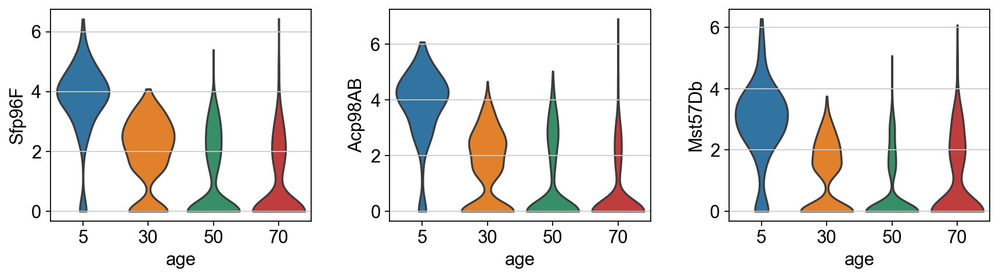

In [19]:
cellType='male accessory gland main cell'
with rc_context({'figure.figsize': (4, 3)}): 
    ax=sc.pl.violin(adata_body[adata_body.obs.afca_annotation == cellType], keys=['Sfp96F', 'Acp98AB', 'Mst57Db'], groupby='age', show=False, size=0) # 
    plt.savefig(f'{markerFolder}/violin_maleMain_Sfp96F_Acp98AB_Mst57Db.pdf')
    plt.show()
    
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

## Gain markers in 50d

### Check top 200 50d markers in the aging population

In [51]:
top200names_Df=pd.read_csv(f'{markerFolder}/top200names_50d.csv')
top200names_Df

,16-cell germline cyst in germarium region 2a and 2b_names,CNS surface associated glial cell_names,adult Malpighian tubule principal cell_names,adult Malpighian tubule principal cell of initial segment_names,adult Malpighian tubule principal cell of lower segment_names,adult Malpighian tubule principal cell of lower ureter_names,adult Malpighian tubule stellate cell of main segment_names,adult alary muscle_names,adult fat body_body_names,adult glial cell_names,...,transmedullary Y neuron TmY5a_names,transmedullary Y neuron TmY8_names,transmedullary neuron Tm1_names,transmedullary neuron Tm2_names,transmedullary neuron Tm20_names,transmedullary neuron Tm29_names,transmedullary neuron Tm3a_names,transmedullary neuron Tm4_names,transmedullary neuron Tm5c_names,transmedullary neuron Tm9_names
0,kirre,how,CG3168,osa,cad,Mur29B,Lkr,bt,apolpp,MESK2,...,beat-Ic,nAChRalpha6,CG31221,KCNQ,bru3,nAChRalpha5,DIP-theta,CG31221,side,Dscam4
1,lncRNA:CR44357,CG5687,CG15406,rut,MYPT-75D,CG10911,tsh,up,CG4716,ct,...,DIP-lambda,beat-IIIc,Pde1c,pdm3,beat-Ic,nAChRalpha7,Ten-a,side-III,klg,eys
2,lncRNA:CR44833,sens-2,CG7084,CG34347,Ndae1,CG4301,CG13323,org-1,CG17124,S,...,kn,Dscam2,Con,Ca-alpha1T,DIP-zeta,Shab,CG4341,side-VI,CG44153,CG45263
3,CG9650,cv-c,Fas2,Ir40a,CG2556,cdi,CG34043,sls,Nplp2,Atpalpha,...,beat-Ib,Rdl,lncRNA:CR44997,lncRNA:CR44997,beat-Ib,Rdl,Rdl,CG42458,nAChRalpha5,mspo
4,lncRNA:CR32773,CLIP-190,l(1)G0196,Myo81F,bru2,CG2556,l(1)G0196,CG1674,CG7470,Rbfox1,...,Dscam2,CG17684,SLO2,Nckx30C,SoxN,Syt1,scro,Frq1,Stacl,pdm3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,GlcAT-P,CG3009,ArfGAP1,Cdep,Gclm,CG9568,Shrm,Sh3beta,santa-maria,CG14441,...,tty,Cadps,Alk,CG43347,CG12531,CG13506,nAChRalpha5,spri,Epac,fs(1)h
196,MYPT-75D,GstS1,4E-T,Top1,CG14441,CG8249,GEFmeso,Timp,CG1213,Mgat2,...,Rbp,smog,CG43347,Tob,nrv3,Ca-alpha1D,MsR1,trn,miple1,Rbp
197,RpL8,CG43897,CG12825,Gprk2,CG42663,CG5096,emb,Tret1-1,pre-rRNA:CR45845,sr,...,qvr,Mid1,Syt4,Fs,CG17716,lncRNA:CR43126,Hs3st-A,eag,CG12994,stj
198,RpL7A,bol,pygo,chic,flfl,CG32633,hid,lncRNA:let7C,aralar1,Baldspot,...,kcc,Nckx30C,Lar,ftz-f1,DIP-kappa,sns,CG43347,CG13685,X11Lbeta,CG11000


In [52]:
markerDE_Df=pd.DataFrame()

for i, cellType in enumerate( [x.split('_names')[0] for x in top200names_Df.columns[:]] ):
    marker_L=top200names_Df.iloc[:,i].to_list()
    
    cellTypeFileName=cellType.replace('/', '_')
    degFile=f'{figure3DataFolder}/ageDEG_compare5d/{cellTypeFileName}_compareTo5d_allPairs.csv'
    try:
        geneSummaryDf, geneSummaryFdrDf = degSummary.degSummary(degFile, cellType, age_L[1:], marker_L)
    except: continue
    
    # print(geneSummaryDf.head())
    geneSummaryDf_50d = geneSummaryDf[geneSummaryDf.age == '50']
    # print(cellType, len(geneSummaryDf_50d))
    
    if len(markerDE_Df) == 0: markerDE_Df=geneSummaryDf
    else: markerDE_Df = pd.concat([markerDE_Df, geneSummaryDf])
    

In [53]:
# markerDE_Df['padj_05'] = ['Significant' if x <= 0.05 else 'Non-significant' for x in markerDE_Df.pvals_adj]

markerDE_Df.reset_index(drop=True, inplace=True)
padj_05_L=[]
for i, adj in enumerate(markerDE_Df.pvals_adj):
    logFC = markerDE_Df.logfoldchanges[i]
    if adj <= 0.05:
        if logFC >0: padj_05_L.append('Increased')
        else: padj_05_L.append('Decreased')
    else: padj_05_L.append('Non-significant')

markerDE_Df['padj_05'] = pd.Categorical(padj_05_L)
markerDE_Df

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
0,RpS7,3.728797e-20,7.453865e-17,-1.988201,16-cell germline cyst in germarium region 2a a...,70,Decreased
1,pum,4.351525e-20,7.732176e-17,0.876278,16-cell germline cyst in germarium region 2a a...,70,Increased
2,RpL23,1.249934e-19,1.817177e-16,-1.810403,16-cell germline cyst in germarium region 2a a...,70,Decreased
3,Ptp61F,1.694514e-19,2.258222e-16,1.832429,16-cell germline cyst in germarium region 2a a...,70,Increased
4,pum,1.210374e-19,6.452101e-16,1.020803,16-cell germline cyst in germarium region 2a a...,50,Increased
...,...,...,...,...,...,...,...
96595,Nckx30C,5.092146e-02,1.000000e+00,0.038932,transmedullary neuron Tm9,50,Non-significant
96596,X11Lbeta,5.052279e-02,1.000000e+00,0.253430,transmedullary neuron Tm9,50,Non-significant
96597,Rim,3.288583e-02,1.000000e+00,0.151862,transmedullary neuron Tm9,50,Non-significant
96598,Shab,1.593231e-02,1.000000e+00,-0.654878,transmedullary neuron Tm9,30,Non-significant


In [54]:
markerDE_Df_50d = markerDE_Df[(markerDE_Df.age == '50') & (markerDE_Df.annotation.isin(filtered_L))]
markerDE_Df_50d

,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
4201,lncRNA:roX1,1.479354e-85,1.182891e-81,4.633634,adult alary muscle,50,Increased
4211,l(3)80Fg,1.913082e-44,7.648501e-41,1.935576,adult alary muscle,50,Increased
4213,uex,5.360351e-42,1.428712e-38,1.719693,adult alary muscle,50,Increased
4220,Sap47,9.069648e-37,1.813023e-33,2.293153,adult alary muscle,50,Increased
4222,MFS17,1.739054e-36,3.090105e-33,1.620096,adult alary muscle,50,Increased
...,...,...,...,...,...,...,...
94795,rdo,2.490781e-01,1.000000e+00,0.258863,transmedullary neuron Tm3a,50,Non-significant
94796,Rdl,2.421995e-01,1.000000e+00,-0.124151,transmedullary neuron Tm3a,50,Non-significant
94797,dpr12,2.354856e-01,1.000000e+00,0.215234,transmedullary neuron Tm3a,50,Non-significant
94798,sns,3.450173e-01,1.000000e+00,0.116058,transmedullary neuron Tm3a,50,Non-significant


In [55]:
summaryDf=pd.DataFrame(columns=['annotation', 'increase#', 'decrease#', 'nonSignificant#', 'total#'])

for cellType in filtered_L[:]:
    degDf = markerDE_Df_50d[markerDE_Df_50d.annotation == cellType]
    valueCount_S = degDf.padj_05.value_counts()
    
    # print(cellType)
    # print(degDf.padj_05.value_counts())
    # print()
    
    summaryDf.loc[cellType]=[cellType, valueCount_S['Increased'], valueCount_S['Decreased'], valueCount_S['Non-significant'], sum([valueCount_S['Increased'], valueCount_S['Decreased'], valueCount_S['Non-significant']])]

summaryDf['decreaseRatio'] = summaryDf['decrease#']/ summaryDf['total#']
summaryDf['increaseRatio'] = summaryDf['increase#']/ summaryDf['total#']
summaryDf

,annotation,increase#,decrease#,nonSignificant#,total#,decreaseRatio,increaseRatio
adult alary muscle,adult alary muscle,58,27,115,200,0.135,0.290
adult fat body_body,adult fat body_body,103,70,27,200,0.350,0.515
adult glial cell,adult glial cell,45,15,140,200,0.075,0.225
adult oenocyte,adult oenocyte,92,66,42,200,0.330,0.460
adult peripheral nervous system,adult peripheral nervous system,34,50,116,200,0.250,0.170
...,...,...,...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,144,21,35,200,0.105,0.720
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,64,28,108,200,0.140,0.320
transmedullary neuron Tm1,transmedullary neuron Tm1,61,48,91,200,0.240,0.305
transmedullary neuron Tm2,transmedullary neuron Tm2,50,48,102,200,0.240,0.250


In [68]:
summaryDf.to_csv(f'{markerFolder}/summaryDf_5d_50d_markerIncrease50d.csv', index=False)

In [56]:
summaryDf.sort_values(by='increase#', inplace=True, ascending=False)

In [70]:
sns.color_palette("coolwarm", 7)

[(0.383662065772549, 0.5101834172862746, 0.9178306732313726),
 (0.5543118699137254, 0.6900970112156862, 0.9955155482352941),
 (0.724041371882353, 0.8149103926470588, 0.9756509706470589),
 (0.8674276350862745, 0.864376599772549, 0.8626024620196079),
 (0.9595176584705882, 0.7669728545098039, 0.6741447150392157),
 (0.9566532109764706, 0.598033822717647, 0.4773022923529412),
 (0.8653913329372549, 0.3711276720470588, 0.2957689564156863)]

In [71]:
color_L=sns.color_palette("coolwarm", 7)[::3]
color_L=[color_L[0], color_L[2], color_L[1]]

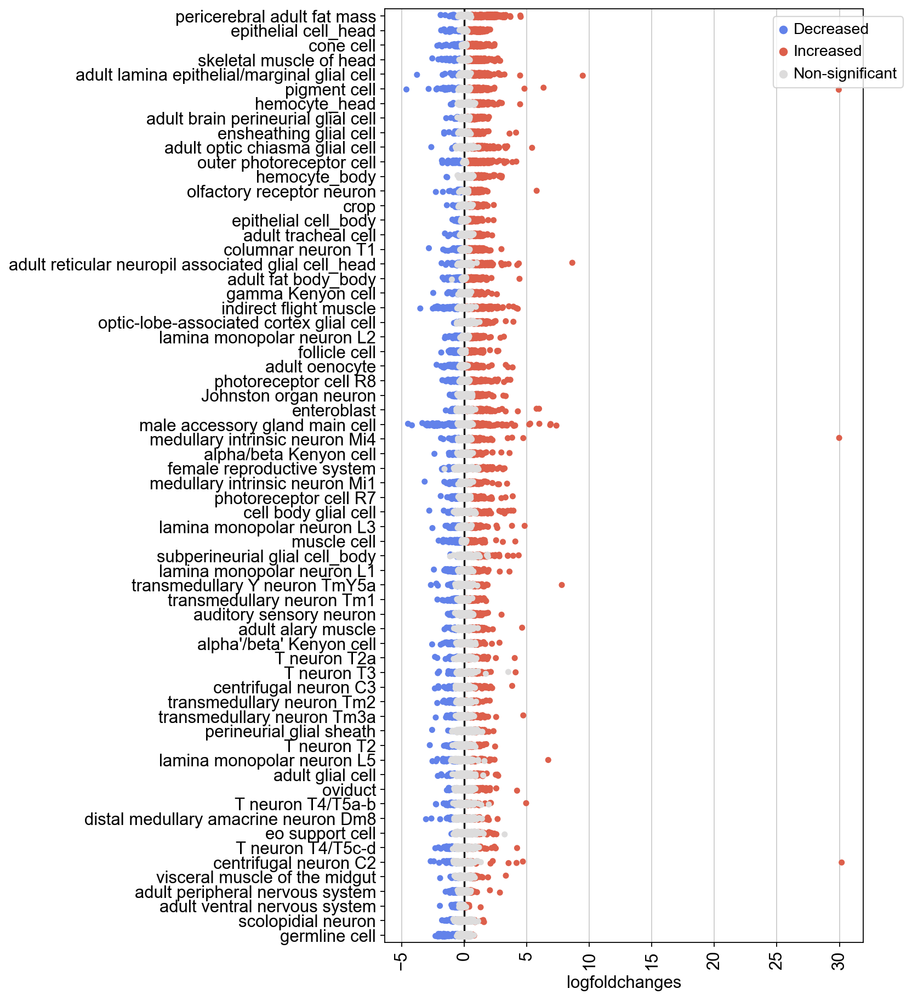

In [72]:
with rc_context({'figure.figsize': (7, 14)}): 
    ax=sns.stripplot(data=markerDE_Df_50d, x="logfoldchanges", y="annotation", order=summaryDf.index.to_list(), hue='padj_05', palette=color_L) #palette=['#2b83ba', '#d7191c', '#abdda4']  'coolwarm'
    plt.xticks(rotation=90)
    plt.axvline(0, color='black')
    plt.legend(bbox_to_anchor=(1.1, 1.00))
    plt.ylabel('')
    
    plt.savefig(f'{markerFolder}/cellType_identity_markerIncrease50d.pdf', bbox_inches='tight')

In [57]:
markerDE_Df_50d['-log10_padj'] = -np.log10(markerDE_Df_50d['pvals_adj'])
markerDE_Df_50d

/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/pandas/core/arraylike.py:405: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_25547/4151087445.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  markerDE_Df_50d['-log10_padj'] = -np.log10(markerDE_Df_50d['pvals_adj'])


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
4201,lncRNA:roX1,1.479354e-85,1.182891e-81,4.633634,adult alary muscle,50,Increased,80.927055
4211,l(3)80Fg,1.913082e-44,7.648501e-41,1.935576,adult alary muscle,50,Increased,40.116424
4213,uex,5.360351e-42,1.428712e-38,1.719693,adult alary muscle,50,Increased,37.845055
4220,Sap47,9.069648e-37,1.813023e-33,2.293153,adult alary muscle,50,Increased,32.741597
4222,MFS17,1.739054e-36,3.090105e-33,1.620096,adult alary muscle,50,Increased,32.510027
...,...,...,...,...,...,...,...,...
94795,rdo,2.490781e-01,1.000000e+00,0.258863,transmedullary neuron Tm3a,50,Non-significant,-0.000000
94796,Rdl,2.421995e-01,1.000000e+00,-0.124151,transmedullary neuron Tm3a,50,Non-significant,-0.000000
94797,dpr12,2.354856e-01,1.000000e+00,0.215234,transmedullary neuron Tm3a,50,Non-significant,-0.000000
94798,sns,3.450173e-01,1.000000e+00,0.116058,transmedullary neuron Tm3a,50,Non-significant,-0.000000


In [30]:
markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'hemocyte_head') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)

/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_2520/61127263.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'hemocyte_head') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
62402,Mmp2,5.694240e-32,1.821246e-28,2.832215,hemocyte_head,50,Increased,27.739631
62403,Parp,1.534549e-30,4.090084e-27,1.514568,hemocyte_head,50,Increased,26.388268
62404,Sema2a,3.605808e-29,7.208011e-26,2.222668,hemocyte_head,50,Increased,25.142185
62411,dpp,4.667015e-26,6.219576e-23,3.013678,hemocyte_head,50,Increased,22.206239
62412,mamo,2.264702e-25,2.785932e-22,1.108324,hemocyte_head,50,Increased,21.555030
62413,pum,3.061332e-25,3.496916e-22,0.651373,hemocyte_head,50,Increased,21.456315
62414,AGO3,2.873595e-24,3.063636e-21,2.263564,hemocyte_head,50,Increased,20.513763
62416,Karl,7.344312e-24,7.340640e-21,2.681751,hemocyte_head,50,Increased,20.134266
62420,Ac13E,8.936796e-23,8.406897e-20,2.205723,hemocyte_head,50,Increased,19.075364
62421,CG42346,1.556307e-22,1.309919e-19,2.932337,hemocyte_head,50,Increased,18.882755


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


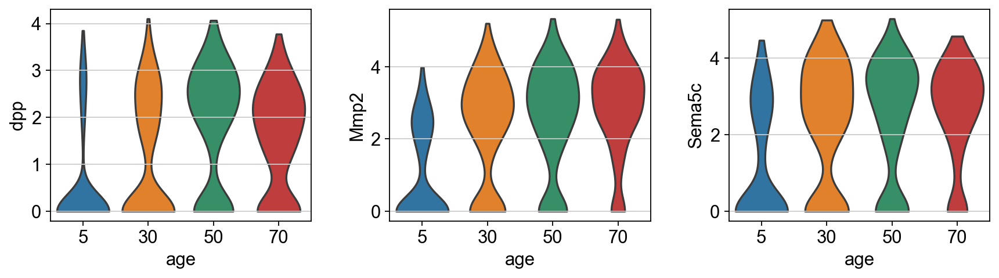

In [20]:
cellType='hemocyte_head'
with rc_context({'figure.figsize': (4,3)}): 
    sc.pl.violin(adata_head[adata_head.obs.afca_annotation == cellType], keys=['dpp', 'Mmp2', 'Sema5c'], groupby='age', save=f'_dpp_Sema2a_Mmp2.pdf', size=0) # 
    # sc.pl.violin(adata_body, keys=['dpp', 'Sema2a', 'Mmp2'], groupby='age', size=0.2, save=f'_Wdr62_Nlg1_body.pdf')
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


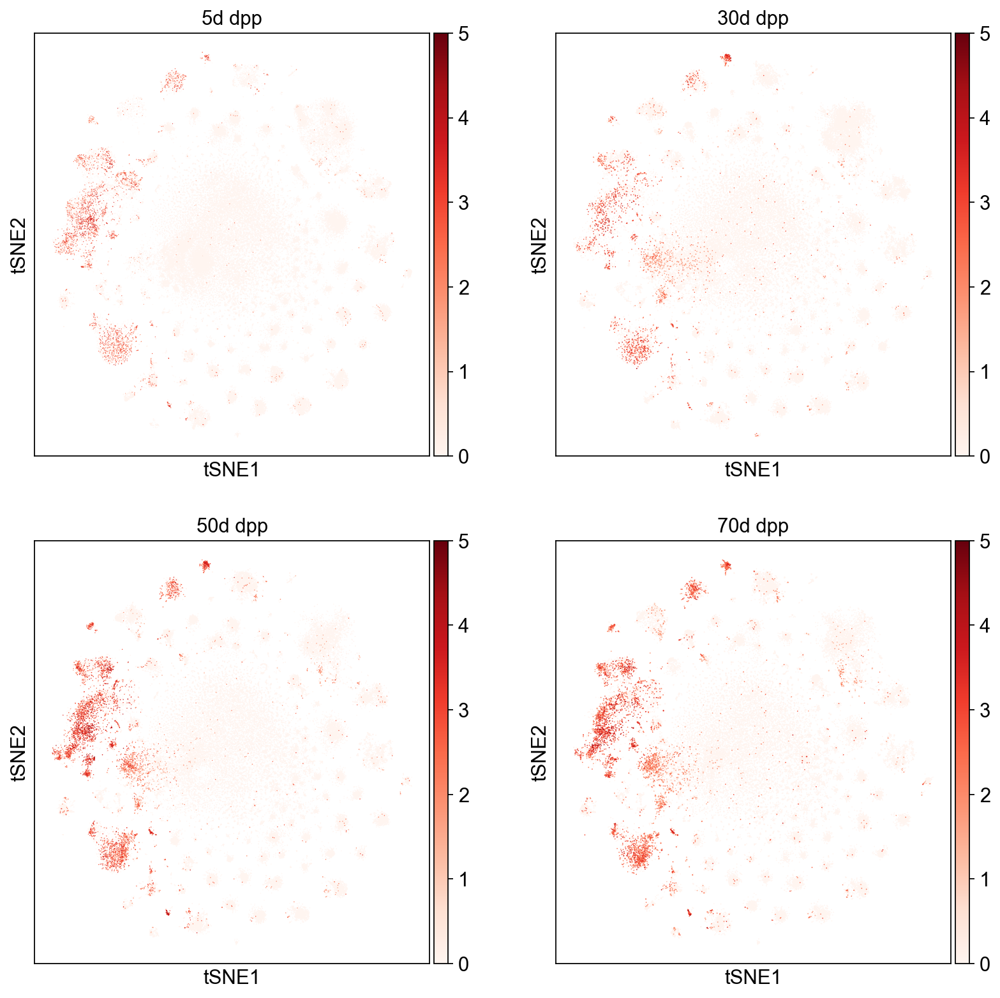

In [256]:
cellType='hemocyte_head'
with rc_context({'figure.figsize': (12, 12)}): 
    fig, axs = plt.subplots(2, 2)
    # for age in age_L:
    ax1= sc.pl.tsne(adata_head[adata_head.obs.age == age_L[0]], color=['dpp'], show=False, ax=axs[0,0], cmap='Reds', vmax=5, title='5d dpp') # , save=f'_dpp_Sema2a_Mmp2.pdf'
    ax2= sc.pl.tsne(adata_head[adata_head.obs.age == age_L[1]], color=['dpp'], show=False, ax=axs[0,1], cmap='Reds', vmax=5, title='30d dpp')
    ax3= sc.pl.tsne(adata_head[adata_head.obs.age == age_L[2]], color=['dpp'], show=False, ax=axs[1,0], cmap='Reds', vmax=5, title='50d dpp')
    ax4= sc.pl.tsne(adata_head[adata_head.obs.age == age_L[3]], color=['dpp'], show=False, ax=axs[1,1], cmap='Reds', vmax=5, title='70d dpp')
        # sc.pl.violin(adata_body, keys=['dpp', 'Sema2a', 'Mmp2'], groupby='age', size=0.2, save=f'_Wdr62_Nlg1_body.pdf')
    plt.savefig(f'{markerFolder}/tsne_head_dpp_age.pdf')
    plt.show()
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

In [24]:
markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'indirect flight muscle') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)

/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_39711/1766144227.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'indirect flight muscle') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05
28250,lncRNA:roX1,3.561930e-145,5.696239e-142,3.939956,indirect flight muscle,50,Increased
28266,CG44774,1.741676e-121,1.326328e-118,4.170508,indirect flight muscle,50,Increased
28278,sls,2.495960e-100,1.209557e-97,1.075973,indirect flight muscle,50,Increased
28303,lncRNA:Hsromega,1.375039e-71,3.233768e-69,1.186115,indirect flight muscle,50,Increased
28305,uex,8.103378e-70,1.799850e-67,1.638188,indirect flight muscle,50,Increased
28311,lncRNA:roX2,4.538166e-65,8.639804e-63,2.694113,indirect flight muscle,50,Increased
28332,CG34423,3.068016e-52,4.229631e-50,2.613454,indirect flight muscle,50,Increased
28335,Xrp1,6.853198e-51,9.057548e-49,1.243256,indirect flight muscle,50,Increased
28336,PMCA,1.118039e-50,1.453633e-48,0.960839,indirect flight muscle,50,Increased
28350,wupA,5.547343e-44,6.291710e-42,1.288559,indirect flight muscle,50,Increased


/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


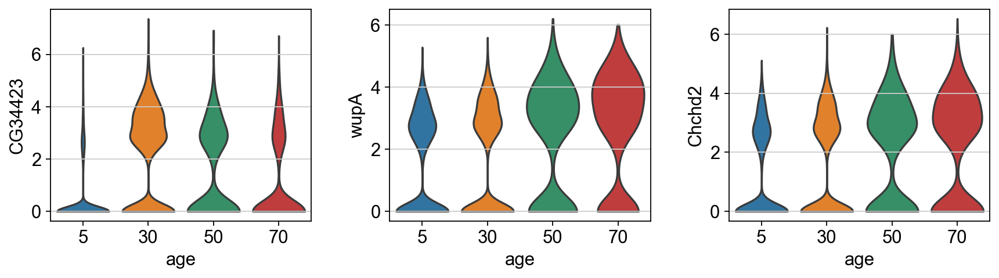

In [21]:
cellType='indirect flight muscle'
with rc_context({'figure.figsize': (4, 3)}): 
    sc.pl.violin(adata_body[adata_body.obs.afca_annotation == cellType], keys=['CG34423', 'wupA', 'Chchd2'], groupby='age', save=f'_CG34423_wupA_Chchd2.pdf', size=0) # 
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

/Users/tzuchiao/opt/anaconda3/envs/scanpy/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


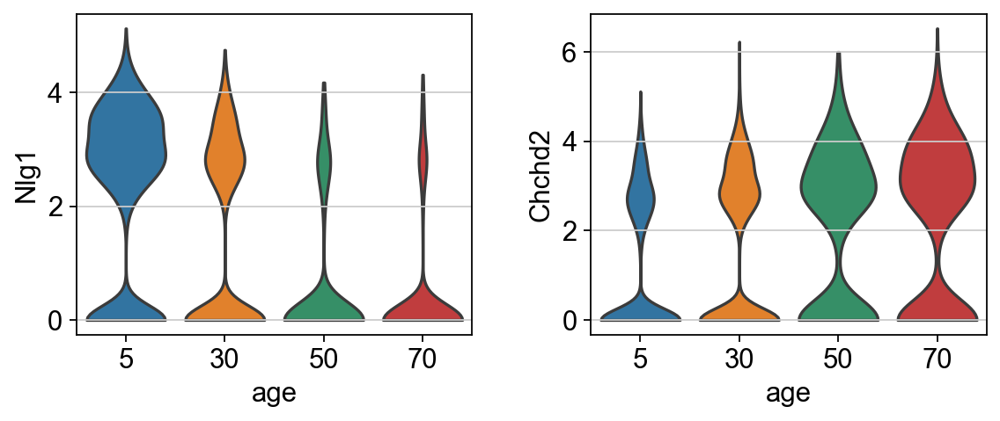

In [22]:
cellType='indirect flight muscle'
with rc_context({'figure.figsize': (4, 3)}): 
    sc.pl.violin(adata_body[adata_body.obs.afca_annotation == cellType], keys=['Nlg1', 'Chchd2'], groupby='age', save=f'_Nlg1_Chchd2.pdf', size=0) # 
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

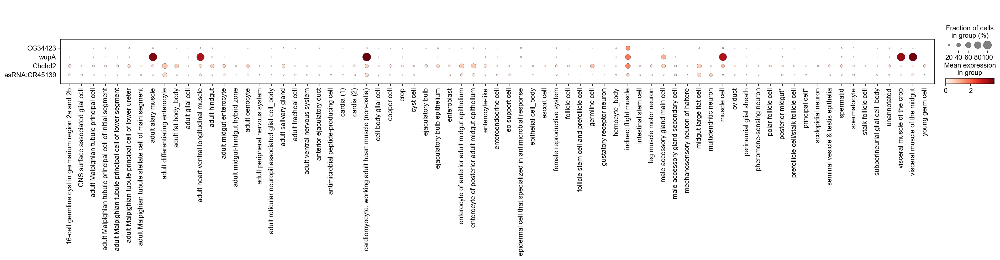

In [34]:
sc.pl.dotplot(adata_body, var_names=['CG34423', 'wupA', 'Chchd2', 'asRNA:CR45139'], groupby='afca_annotation', swap_axes=True)

In [257]:
markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'pericerebral adult fat mass') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)

/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_2520/1555708007.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'pericerebral adult fat mass') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
85203,CaMKI,4.05e-96,2.16e-92,2.56,pericerebral adult fat mass,50,Increased,91.67
85207,path,3.24e-90,1.04e-86,3.25,pericerebral adult fat mass,50,Increased,85.98
85210,bru1,4.51e-87,1.20e-83,3.01,pericerebral adult fat mass,50,Increased,82.92
85229,Pdk1,4.90e-69,1.12e-65,3.27,pericerebral adult fat mass,50,Increased,64.95
85231,lncRNA:CR42862,1.45e-68,2.57e-65,1.83,pericerebral adult fat mass,50,Increased,64.59
85234,CG17124,1.44e-67,2.30e-64,2.36,pericerebral adult fat mass,50,Increased,63.64
85246,Drak,6.59e-64,9.58e-61,3.31,pericerebral adult fat mass,50,Increased,60.02
85248,l(3)80Fj,1.35e-63,1.80e-60,2.27,pericerebral adult fat mass,50,Increased,59.74
85252,NFAT,7.22e-63,8.88e-60,2.31,pericerebral adult fat mass,50,Increased,59.05
85255,fz2,1.70e-62,1.94e-59,3.14,pericerebral adult fat mass,50,Increased,58.71


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


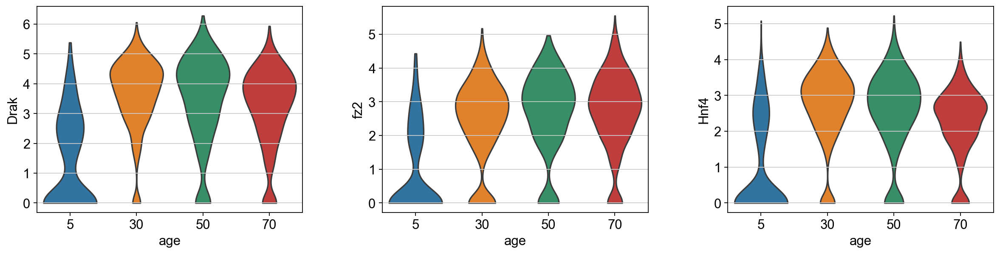

In [64]:
cellType='pericerebral adult fat mass'
with rc_context({'figure.figsize': (5, 4)}): 
    ax=sc.pl.violin(adata_head[adata_head.obs.afca_annotation == cellType], keys=['Drak', 'fz2', 'Hnf4'], groupby='age',  size=0, show=False) # save=f'_Drak_fz2_Hnf.pdf',
    plt.savefig(f'{markerFolder}/violin_Drak_fz2_Hnf.pdf')
    plt.show()
    # sc.pl.violin(adata_body, keys=['dpp', 'Sema2a', 'Mmp2'], groupby='age', size=0.2, save=f'_Wdr62_Nlg1_body.pdf')
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

In [58]:
markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'male accessory gland main cell') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)

/var/folders/jj/t95qp6v1343877pd7n071t200000gp/T/ipykernel_25547/1117929027.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  markerDE_Df_50d.sort_values(by='pvals_adj')[(markerDE_Df_50d.annotation == 'male accessory gland main cell') & (markerDE_Df_50d.padj_05 == 'Increased')].head(30)


,names,pvals,pvals_adj,logfoldchanges,annotation,age,padj_05,-log10_padj
29402,CG10077,1.215659e-93,1.944081e-89,3.402224,male accessory gland main cell,50,Increased,88.711286
29407,Hsp26,1.795975e-78,9.573747e-75,6.878105,male accessory gland main cell,50,Increased,74.018918
29414,mfas,1.037506e-73,2.370256e-70,2.281517,male accessory gland main cell,50,Increased,69.625205
29417,Hsp27,1.878241e-68,3.337426e-65,6.914083,male accessory gland main cell,50,Increased,64.476588
29419,lncRNA:alphagamma-element:CR32865,2.292641e-65,3.333083e-62,6.011707,male accessory gland main cell,50,Increased,61.477154
29428,hdc,2.051331e-56,2.523453e-53,3.429066,male accessory gland main cell,50,Increased,52.598005
29429,CG6770,3.392086e-56,3.874732e-53,3.046052,male accessory gland main cell,50,Increased,52.411758
29430,Hsp70Ab,5.326895e-56,5.679180e-53,5.204415,male accessory gland main cell,50,Increased,52.245714
29431,Cip4,1.136579e-54,1.069187e-51,4.075727,male accessory gland main cell,50,Increased,50.970946
29432,luna,1.292537e-54,1.148348e-51,3.044384,male accessory gland main cell,50,Increased,50.939927


/Users/tzuchiao/opt/anaconda3/envs/scanpyLast/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


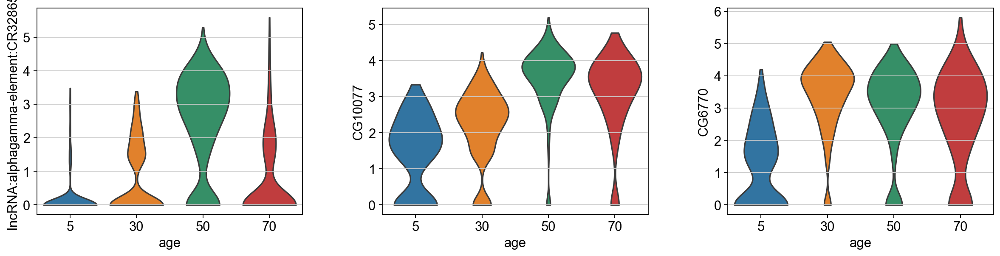

In [65]:
cellType='male accessory gland main cell'
with rc_context({'figure.figsize': (5, 4)}): 
    ax=sc.pl.violin(adata_body[adata_body.obs.afca_annotation == cellType], keys=['lncRNA:alphagamma-element:CR32865', 'CG10077', 'CG6770'], groupby='age',  size=0, show=False) # save=f'_Drak_fz2_Hnf.pdf',
    plt.savefig(f'{markerFolder}/violin_lncRNA:alphagamma-element_CR32865_CG10077_CG6770.pdf', bbox_inches='tight')
    plt.show()
    # sc.pl.violin(adata_body, keys=['dpp', 'Sema2a', 'Mmp2'], groupby='age', size=0.2, save=f'_Wdr62_Nlg1_body.pdf')
for x in os.listdir('figures/'): 
    os.replace(f'figures/{x}', f'{markerFolder}/{x}')

## Summzrize loss and gain of markers

In [18]:
lossMarker_Df=pd.read_csv(f'{markerFolder}/summaryDf_5d_50d_markerDecrease5d.csv')
lossMarker_Df.index = lossMarker_Df.annotation.to_list()
lossMarker_Df

,annotation,increase#,decrease#,nonSignificant#,total#,decreaseRatio
adult alary muscle,adult alary muscle,39,41,120,200,0.205
adult fat body_body,adult fat body_body,63,118,19,200,0.590
adult glial cell,adult glial cell,23,23,154,200,0.115
adult oenocyte,adult oenocyte,51,117,32,200,0.585
adult peripheral nervous system,adult peripheral nervous system,26,70,104,200,0.350
...,...,...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,85,71,44,200,0.355
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,52,37,111,200,0.185
transmedullary neuron Tm1,transmedullary neuron Tm1,45,69,86,200,0.345
transmedullary neuron Tm2,transmedullary neuron Tm2,39,69,92,200,0.345


In [19]:
gainMarker_Df=pd.read_csv(f'{markerFolder}/summaryDf_5d_50d_markerIncrease50d.csv')
gainMarker_Df.index = gainMarker_Df.annotation.to_list()
gainMarker_Df

,annotation,increase#,decrease#,nonSignificant#,total#,decreaseRatio,increaseRatio
adult alary muscle,adult alary muscle,58,27,115,200,0.135,0.290
adult fat body_body,adult fat body_body,103,70,27,200,0.350,0.515
adult glial cell,adult glial cell,45,15,140,200,0.075,0.225
adult oenocyte,adult oenocyte,92,66,42,200,0.330,0.460
adult peripheral nervous system,adult peripheral nervous system,34,50,116,200,0.250,0.170
...,...,...,...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,144,21,35,200,0.105,0.720
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,64,28,108,200,0.140,0.320
transmedullary neuron Tm1,transmedullary neuron Tm1,61,48,91,200,0.240,0.305
transmedullary neuron Tm2,transmedullary neuron Tm2,50,48,102,200,0.240,0.250


In [23]:
markerFluctuation_Df = pd.DataFrame(columns=['annotation', 'Marker loss', 'Marker gain'])

for cellType in lossMarker_Df.annotation:
    # print(cellType)
    
    markerLoss = lossMarker_Df.loc[cellType, 'decreaseRatio']
    markerGain = gainMarker_Df.loc[cellType, 'increaseRatio']
    markerFluctuation_Df.loc[cellType]=[cellType, markerLoss, markerGain]
    
markerFluctuation_Df['loss_and_gain'] = markerFluctuation_Df['Marker loss'] + markerFluctuation_Df['Marker gain']
markerFluctuation_Df

,annotation,Marker loss,Marker gain,loss_and_gain
adult alary muscle,adult alary muscle,0.205,0.290,0.495
adult fat body_body,adult fat body_body,0.590,0.515,1.105
adult glial cell,adult glial cell,0.115,0.225,0.340
adult oenocyte,adult oenocyte,0.585,0.460,1.045
adult peripheral nervous system,adult peripheral nervous system,0.350,0.170,0.520
...,...,...,...,...
skeletal muscle of head,skeletal muscle of head,0.355,0.720,1.075
transmedullary Y neuron TmY5a,transmedullary Y neuron TmY5a,0.185,0.320,0.505
transmedullary neuron Tm1,transmedullary neuron Tm1,0.345,0.305,0.650
transmedullary neuron Tm2,transmedullary neuron Tm2,0.345,0.250,0.595


In [24]:
markerFluctuation_Df.sort_values(by='Marker loss', ascending=False, inplace=True)
markerFluctuation_Df

,annotation,Marker loss,Marker gain,loss_and_gain
male accessory gland main cell,male accessory gland main cell,0.790,0.395,1.185
indirect flight muscle,indirect flight muscle,0.760,0.475,1.235
adult ventral nervous system,adult ventral nervous system,0.655,0.135,0.790
adult fat body_body,adult fat body_body,0.590,0.515,1.105
adult oenocyte,adult oenocyte,0.585,0.460,1.045
...,...,...,...,...
adult optic chiasma glial cell,adult optic chiasma glial cell,0.065,0.605,0.670
hemocyte_head,hemocyte_head,0.050,0.615,0.665
eo support cell,eo support cell,0.045,0.210,0.255
perineurial glial sheath,perineurial glial sheath,0.045,0.245,0.290


In [25]:
markerFluctuation_Df['loss_and_gain'] = markerFluctuation_Df['loss_and_gain']*0.5
markerFluctuation_Df

,annotation,Marker loss,Marker gain,loss_and_gain
male accessory gland main cell,male accessory gland main cell,0.790,0.395,0.5925
indirect flight muscle,indirect flight muscle,0.760,0.475,0.6175
adult ventral nervous system,adult ventral nervous system,0.655,0.135,0.3950
adult fat body_body,adult fat body_body,0.590,0.515,0.5525
adult oenocyte,adult oenocyte,0.585,0.460,0.5225
...,...,...,...,...
adult optic chiasma glial cell,adult optic chiasma glial cell,0.065,0.605,0.3350
hemocyte_head,hemocyte_head,0.050,0.615,0.3325
eo support cell,eo support cell,0.045,0.210,0.1275
perineurial glial sheath,perineurial glial sheath,0.045,0.245,0.1450


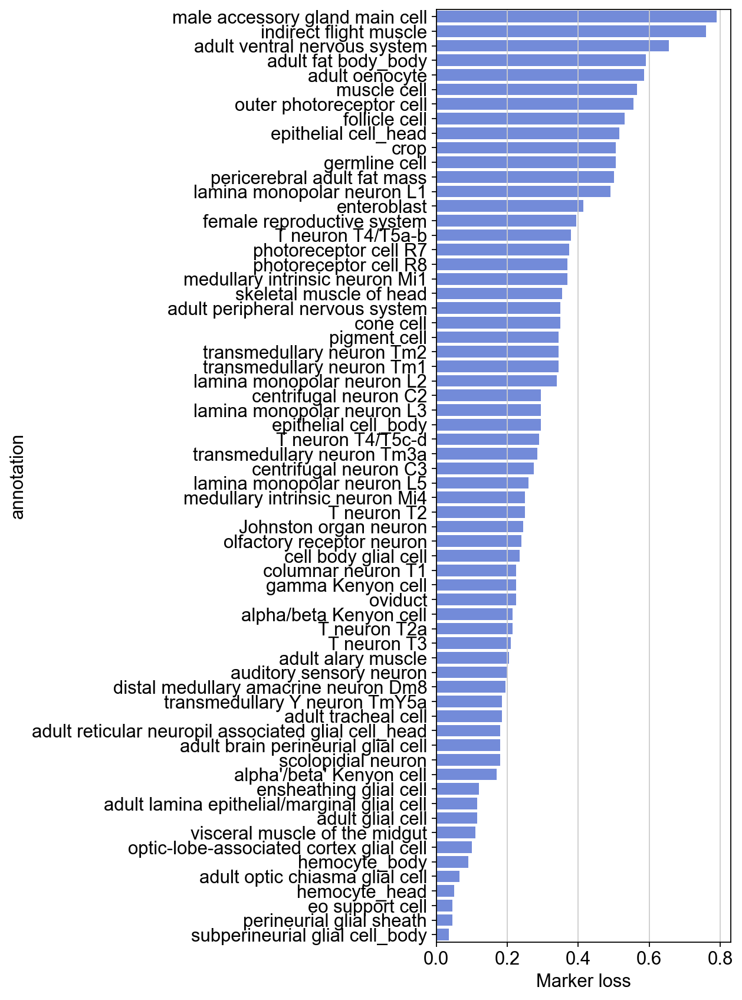

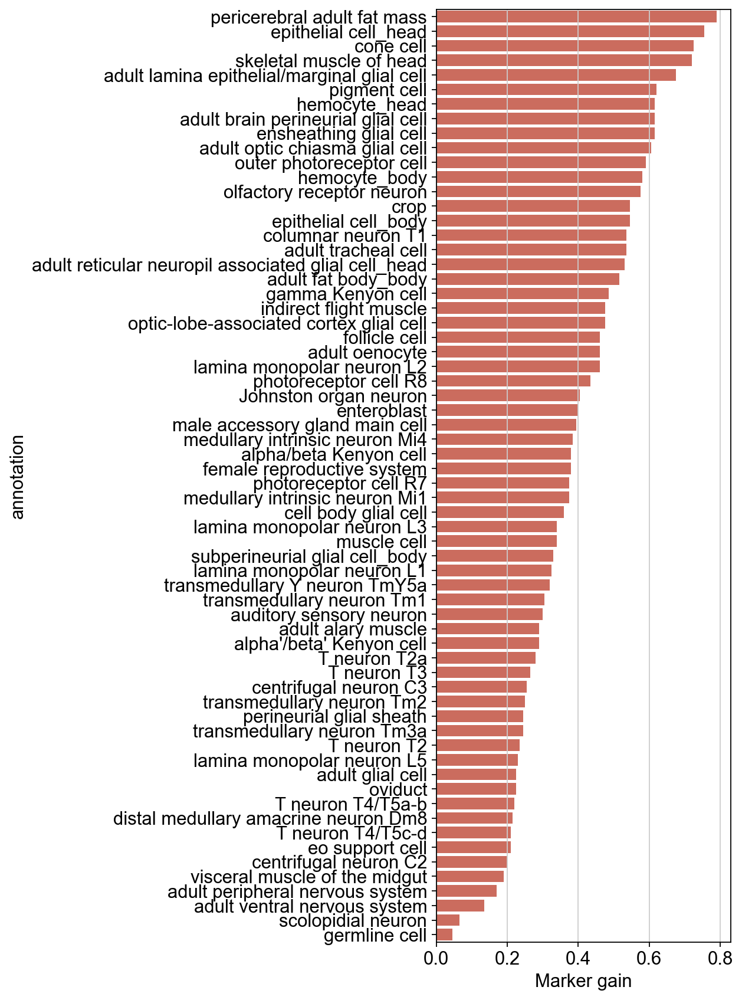

In [87]:
with rc_context({'figure.figsize': (4, 13)}):
    sns.barplot(data=markerFluctuation_Df, x='Marker loss', y='annotation', color=color_L[0])
    plt.savefig(f'{markerFolder}/MarkerLoss_ratio.pdf', bbox_inches='tight')
    plt.show()
    
    sns.barplot(data=markerFluctuation_Df.sort_values(by='Marker gain', ascending=False), x='Marker gain', y='annotation', color=color_L[1])
    plt.savefig(f'{markerFolder}/MarkerGain_ratio.pdf', bbox_inches='tight')
    plt.show()

In [28]:
markerFluctuation_Df.to_csv(f'{markerFolder}/markerFluctuation_Df.csv', index=False)

In [29]:
markerFluctuation_Df.sort_values(by='loss_and_gain', ascending=False, inplace=True)
markerFluctuation_Df

,annotation,Marker loss,Marker gain,loss_and_gain
pericerebral adult fat mass,pericerebral adult fat mass,0.500,0.790,0.6450
epithelial cell_head,epithelial cell_head,0.515,0.755,0.6350
indirect flight muscle,indirect flight muscle,0.760,0.475,0.6175
male accessory gland main cell,male accessory gland main cell,0.790,0.395,0.5925
outer photoreceptor cell,outer photoreceptor cell,0.555,0.590,0.5725
...,...,...,...,...
adult glial cell,adult glial cell,0.115,0.225,0.1700
visceral muscle of the midgut,visceral muscle of the midgut,0.110,0.190,0.1500
perineurial glial sheath,perineurial glial sheath,0.045,0.245,0.1450
eo support cell,eo support cell,0.045,0.210,0.1275


In [30]:
markerFluctuation_Df.loss_and_gain.describe()

count    64.000000
mean      0.349414
std       0.128309
min       0.122500
25%       0.250000
50%       0.333750
75%       0.407500
max       0.645000
Name: loss_and_gain, dtype: float64

In [93]:
markerFluctuation_Df_long = markerFluctuation_Df.iloc[:, :-1].melt(id_vars='annotation', var_name='group', value_name='ratio')
markerFluctuation_Df_long.ratio = markerFluctuation_Df_long.ratio/2
markerFluctuation_Df_long

,annotation,group,ratio
0,pericerebral adult fat mass,Marker loss,0.2500
1,epithelial cell_head,Marker loss,0.2575
2,indirect flight muscle,Marker loss,0.3800
3,male accessory gland main cell,Marker loss,0.3950
4,outer photoreceptor cell,Marker loss,0.2775
...,...,...,...
123,adult glial cell,Marker gain,0.1125
124,visceral muscle of the midgut,Marker gain,0.0950
125,perineurial glial sheath,Marker gain,0.1225
126,eo support cell,Marker gain,0.1050


In [94]:
markerFluctuation_Df

,annotation,Marker loss,Marker gain,loss_and_gain
pericerebral adult fat mass,pericerebral adult fat mass,0.500,0.790,1.290
epithelial cell_head,epithelial cell_head,0.515,0.755,1.270
indirect flight muscle,indirect flight muscle,0.760,0.475,1.235
male accessory gland main cell,male accessory gland main cell,0.790,0.395,1.185
outer photoreceptor cell,outer photoreceptor cell,0.555,0.590,1.145
...,...,...,...,...
adult glial cell,adult glial cell,0.115,0.225,0.340
visceral muscle of the midgut,visceral muscle of the midgut,0.110,0.190,0.300
perineurial glial sheath,perineurial glial sheath,0.045,0.245,0.290
eo support cell,eo support cell,0.045,0.210,0.255


In [96]:
markerFluctuation_Df_select=markerFluctuation_Df.iloc[list(range(0, 10)) + list(range(len(markerFluctuation_Df)-10, len(markerFluctuation_Df))), 1:-1]

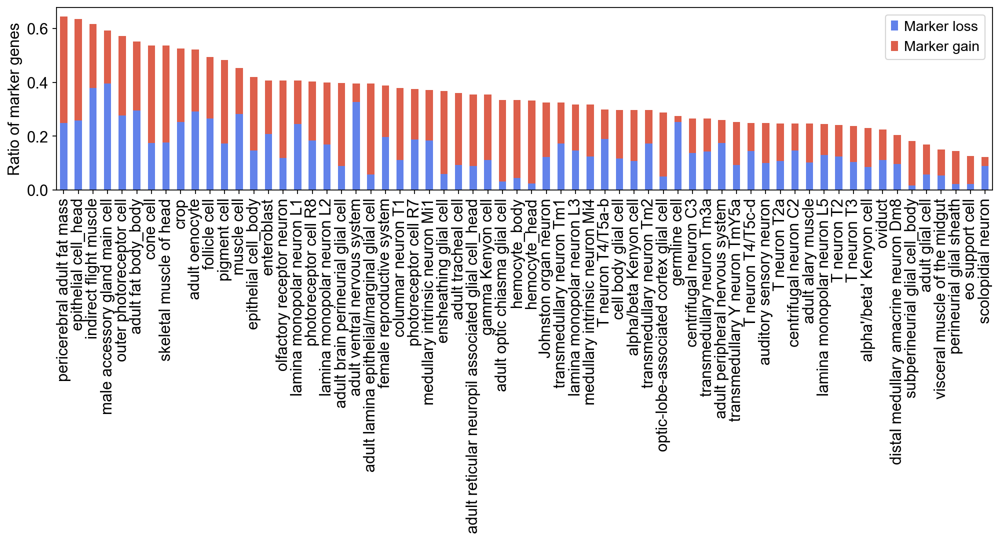

In [97]:
with rc_context({'figure.figsize': (15, 3)}):
    # plot the bars
    # fig, ax = plt.subplots()
    ax=(markerFluctuation_Df.iloc[:,1:-1]/2).plot(kind='bar', stacked=True, color=color_L )
    # ax=sns.barplot(data=markerFluctuation_Df, x='Marker loss', y='annotation', color=color_L[0])
    # ax2=sns.barplot(data=markerFluctuation_Df, x='Marker gain', y='annotation', color=color_L[0])
    ax.grid(axis='both',visible=False)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.ylabel('Ratio of marker genes')
    plt.savefig(f'{markerFolder}/Marker_lossGain_ratio_stacked.pdf', bbox_inches='tight')
    
    plt.show()

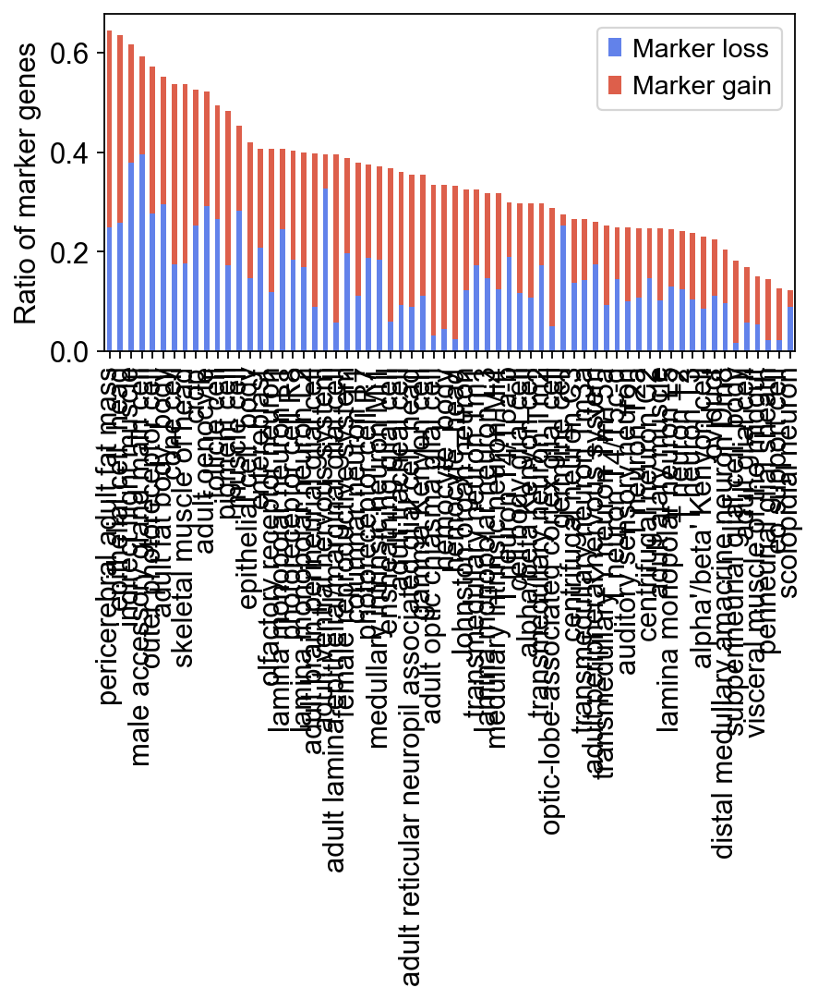

In [98]:
with rc_context({'figure.figsize': (6, 3)}):
    # plot the bars
    # fig, ax = plt.subplots()
    ax=(markerFluctuation_Df.iloc[:,1:-1]/2).plot(kind='bar', stacked=True, color=color_L )
    # ax=sns.barplot(data=markerFluctuation_Df, x='Marker loss', y='annotation', color=color_L[0])
    # ax2=sns.barplot(data=markerFluctuation_Df, x='Marker gain', y='annotation', color=color_L[0])
    ax.grid(axis='both',visible=False)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.ylabel('Ratio of marker genes')
    plt.savefig(f'{markerFolder}/Marker_lossGain_ratio_stacked_narrow.pdf', bbox_inches='tight')
    
    plt.show()

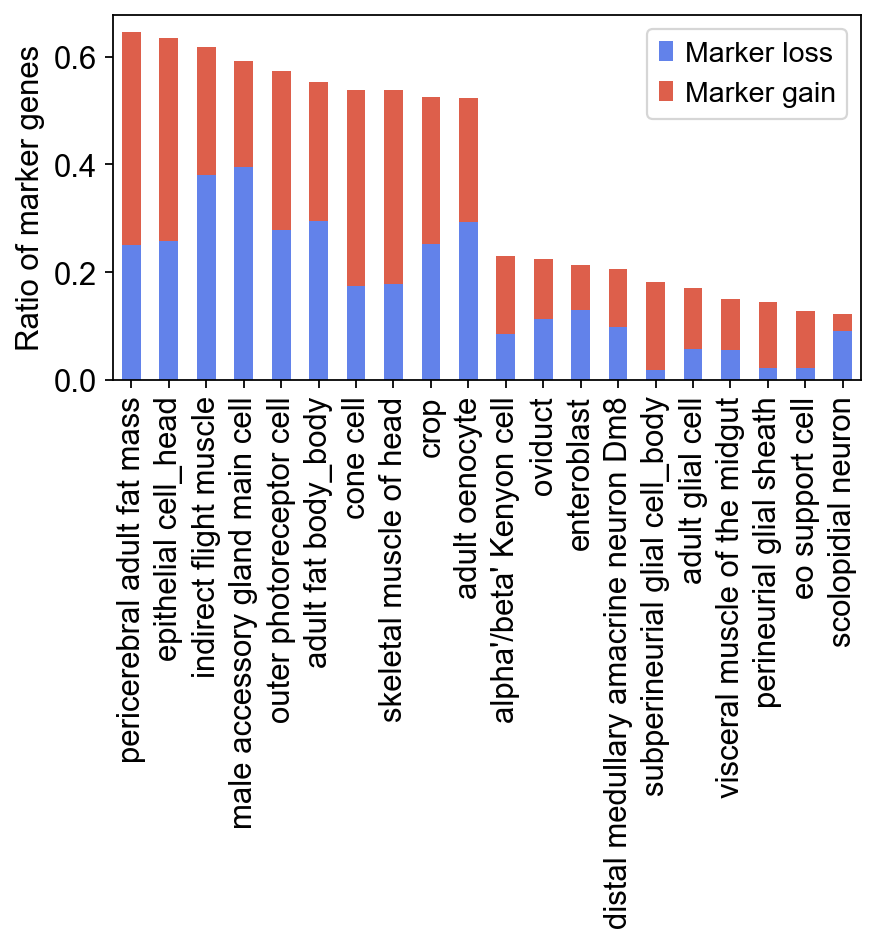

In [203]:
with rc_context({'figure.figsize': (6, 3)}):
    # plot the bars
    # fig, ax = plt.subplots()
    ax=(markerFluctuation_Df_select/2).plot(kind='bar', stacked=True, color=color_L )
    # ax=sns.barplot(data=markerFluctuation_Df, x='Marker loss', y='annotation', color=color_L[0])
    # ax2=sns.barplot(data=markerFluctuation_Df, x='Marker gain', y='annotation', color=color_L[0])
    ax.grid(axis='both',visible=False)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.ylabel('Ratio of marker genes')
    plt.savefig(f'{markerFolder}/Marker_lossGain_ratio_stacked_top10.pdf', bbox_inches='tight')
    
    plt.show()

In [ ]:
with rc_context({'figure.figsize': (4, 3)}):
    # plot the bars
    # fig, ax = plt.subplots()
    ax=(markerFluctuation_Df_select.iloc[:10,1:-1]/2).plot(kind='bar', stacked=True, color=color_L )
    # ax=sns.barplot(data=markerFluctuation_Df, x='Marker loss', y='annotation', color=color_L[0])
    # ax2=sns.barplot(data=markerFluctuation_Df, x='Marker gain', y='annotation', color=color_L[0])
    ax.grid(axis='both',visible=False)
    plt.legend(bbox_to_anchor=(1.00, 1.00))
    plt.ylabel('Ratio of marker genes')
    plt.savefig(f'{markerFolder}/Marker_lossGain_ratio_stacked.pdf', bbox_inches='tight')
    
    plt.show()

# Aging feature: correlation

In [14]:
filtered_L = [x.strip() for x in open('Analysis/Figure/Figure3/agingFeature_cellTypeName_modified_selected.list')]

## import different features

In [15]:
cellRatio_Df = pd.read_csv(f'{figure2DataFolder}/cellN/headBody_normalRatioDf_normalizeTo5d.csv', index_col=0).iloc[:,1:]
cellRatio_Df

,annotation,30d/5d_ratio,50d/5d_ratio,70d/5d_ratio,tissue
cardia (1),cardia (1),3.366614,3.970931,3.720461,body
adult fat body_body,adult fat body_body,2.441033,2.784070,2.185617,body
male accessory gland main cell,male accessory gland main cell,2.174354,2.545936,0.900669,body
enteroblast,enteroblast,1.664538,2.471348,2.500458,body
adult salivary gland,adult salivary gland,2.402504,2.364433,2.241751,body
...,...,...,...,...,...
visceral muscle of the crop,visceral muscle of the crop,-0.803392,-1.091072,-1.644615,body
muscle cell,muscle cell,-0.766909,-1.220535,-1.249407,body
germline cell,germline cell,-2.107656,-1.261042,-0.698137,body
adult reticular neuropil associated glial cell_body,adult reticular neuropil associated glial cell...,1.084027,-1.350827,-0.445817,body


In [16]:
degDf = pd.read_csv(f'{figure3DataFolder}/degSummary/degN_Df_compareTo5d_cellN500.csv')
degDf.index = degDf.annotation
degDf

,30d_5d,50d_5d,70d_5d,totalCellN,annotation
annotation,,,,,
adult fat body_body,4145,3845,2682,10672.0,adult fat body_body
follicle cell,2671,2423,1947,7041.0,follicle cell
outer photoreceptor cell,1647,2198,2899,6744.0,outer photoreceptor cell
adult ventral nervous system,1860,2512,1927,6299.0,adult ventral nervous system
adult oenocyte,1793,1835,1520,5148.0,adult oenocyte
...,...,...,...,...,...
transmedullary Y neuron TmY4,30,81,50,161.0,transmedullary Y neuron TmY4
pheromone-sensing neuron,44,30,46,120.0,pheromone-sensing neuron
gustatory receptor neuron,56,18,44,118.0,gustatory receptor neuron


In [17]:
geneN_Df = pd.read_csv(f'{figure5Folder}/headBody_geneN_MedianRatio.csv', index_col=0)
geneN_Df.insert(0, 'annotation', geneN_Df.index.to_list())
geneN_Df

,annotation,5,30,50,70,30d/5d_ratio,30d/5d_log2ratio,50d/5d_ratio,50d/5d_log2ratio,70d/5d_ratio,70d/5d_log2ratio
16-cell germline cyst in germarium region 2a and 2b,16-cell germline cyst in germarium region 2a a...,1432.0,773.0,935.5,1184.0,0.539804,-0.889491,0.653282,-0.614222,0.826816,-0.274362
CNS surface associated glial cell,CNS surface associated glial cell,400.5,368.0,358.5,343.0,0.918851,-0.122096,0.895131,-0.159829,0.856429,-0.223594
Johnston organ neuron,Johnston organ neuron,501.0,491.0,515.0,608.0,0.980040,-0.029088,1.027944,0.039762,1.213573,0.279261
Kenyon cell,Kenyon cell,632.5,705.0,677.5,727.0,1.114625,0.156558,1.071146,0.099155,1.149407,0.200890
Poxn neuron,Poxn neuron,727.5,616.0,756.5,909.5,0.846735,-0.240017,1.039863,0.056393,1.250172,0.322126
...,...,...,...,...,...,...,...,...,...,...,...
transmedullary neuron Tm9,transmedullary neuron Tm9,458.0,401.0,389.0,418.0,0.875546,-0.191745,0.849345,-0.235577,0.912664,-0.131845
unannotated,unannotated,704.0,586.0,600.0,739.0,0.832386,-0.264675,0.852273,-0.230613,1.049716,0.069999
visceral muscle of the crop,visceral muscle of the crop,554.0,533.0,523.0,600.0,0.962094,-0.055750,0.944043,-0.083075,1.083032,0.115077
visceral muscle of the midgut,visceral muscle of the midgut,813.0,718.5,673.5,802.0,0.883764,-0.178267,0.828413,-0.271577,0.986470,-0.019653


In [18]:
markerDE_Df = pd.read_csv(f'{figure5Folder}/marker/markerFluctuation_Df.csv')
markerDE_Df.index = markerDE_Df.annotation.to_list()
markerDE_Df.sort_values(by='Marker loss', ascending=False)

markerDE_Df

,annotation,Marker loss,Marker gain,loss_and_gain
subperineurial glial cell_body,subperineurial glial cell_body,0.035,0.330,0.1825
perineurial glial sheath,perineurial glial sheath,0.045,0.245,0.1450
eo support cell,eo support cell,0.045,0.210,0.1275
hemocyte_head,hemocyte_head,0.050,0.615,0.3325
adult optic chiasma glial cell,adult optic chiasma glial cell,0.065,0.605,0.3350
...,...,...,...,...
adult oenocyte,adult oenocyte,0.585,0.460,0.5225
adult fat body_body,adult fat body_body,0.590,0.515,0.5525
adult ventral nervous system,adult ventral nervous system,0.655,0.135,0.3950
indirect flight muscle,indirect flight muscle,0.760,0.475,0.6175


In [19]:
agingClock_Df = pd.read_csv(f'{figure5Folder}/AFCA_clock_genes_score_11012022.csv')
agingClock_Df.index = agingClock_Df['Cell type'].to_list()
agingClock_Df.sort_values(by='Aging clock score', ascending=False)

,Cell type,Aging clock gene #,Aging clock score
outer photoreceptor cell,outer photoreceptor cell,72,0.912
adult oenocyte,adult oenocyte,99,0.910
lamina monopolar neuron L1,lamina monopolar neuron L1,33,0.890
lamina monopolar neuron L2,lamina monopolar neuron L2,29,0.877
lamina monopolar neuron L3,lamina monopolar neuron L3,17,0.877
...,...,...,...
cardiomyocyte working adult heart muscle (non-ostia),cardiomyocyte working adult heart muscle (non-...,284,0.167
adult Malpighian tubule stellate cell of main segment,adult Malpighian tubule stellate cell of main ...,529,0.137
adult Malpighian tubule principal cell,adult Malpighian tubule principal cell,142,0.018
adult Malpighian tubule principal cell of lower ureter,adult Malpighian tubule principal cell of lowe...,111,-0.056


In [20]:
aging_Df = pd.DataFrame(columns=['Change of cell #', 'DEG #', 'Change of gene #', 'Identity decline', 'Aging clock score'], 
                        index=filtered_L)

aging_Df['Change of cell #'] = [cellRatio_Df.loc[ct, '50d/5d_ratio'] for ct in aging_Df.index]
aging_Df['DEG #'] = [degDf.loc[ct, '50d_5d'] for ct in aging_Df.index]
aging_Df['Change of gene #'] = [geneN_Df.loc[ct, '50d/5d_log2ratio'] for ct in aging_Df.index]
aging_Df['Identity decline'] = [markerDE_Df.loc[ct, 'loss_and_gain'] for ct in aging_Df.index]
aging_Df['Aging clock score'] = [agingClock_Df.loc[ct, 'Aging clock score'] for ct in aging_Df.index]

aging_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score
adult alary muscle,1.332664,310,-0.294399,0.2475,0.729
adult fat body_body,2.784070,3845,-0.647621,0.5525,0.809
adult glial cell,-0.495097,194,-0.201802,0.1700,0.784
adult oenocyte,1.740676,1835,-0.741369,0.5225,0.910
adult peripheral nervous system,-0.733756,510,-0.322585,0.2600,0.766
...,...,...,...,...,...
skeletal muscle of head,1.294277,1101,0.111846,0.5375,0.797
transmedullary Y neuron TmY5a,0.351287,328,-0.189504,0.2525,0.837
transmedullary neuron Tm1,-0.312016,433,-0.276791,0.3250,0.847
transmedullary neuron Tm2,-0.356349,417,-0.332575,0.2975,0.846


In [21]:
# aging_Df.to_csv(f'{figure5Folder}/agingFeatures_11142022.csv', index=True)
aging_Df.to_csv(f'{figure5Folder}/agingFeatures_12072022.csv', index=True)

## Plot the correlation

In [22]:
from scipy.stats import spearmanr

In [23]:
aging_Df=pd.read_csv(f'{figure5Folder}/agingFeatures_12072022.csv', index_col=0)
aging_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score
adult alary muscle,1.332664,310,-0.294399,0.2475,0.729
adult fat body_body,2.784070,3845,-0.647621,0.5525,0.809
adult glial cell,-0.495097,194,-0.201802,0.1700,0.784
adult oenocyte,1.740676,1835,-0.741369,0.5225,0.910
adult peripheral nervous system,-0.733756,510,-0.322585,0.2600,0.766
...,...,...,...,...,...
skeletal muscle of head,1.294277,1101,0.111846,0.5375,0.797
transmedullary Y neuron TmY5a,0.351287,328,-0.189504,0.2525,0.837
transmedullary neuron Tm1,-0.312016,433,-0.276791,0.3250,0.847
transmedullary neuron Tm2,-0.356349,417,-0.332575,0.2975,0.846


In [24]:
aging_Df=abs(aging_Df)
aging_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score
adult alary muscle,1.332664,310,0.294399,0.2475,0.729
adult fat body_body,2.784070,3845,0.647621,0.5525,0.809
adult glial cell,0.495097,194,0.201802,0.1700,0.784
adult oenocyte,1.740676,1835,0.741369,0.5225,0.910
adult peripheral nervous system,0.733756,510,0.322585,0.2600,0.766
...,...,...,...,...,...
skeletal muscle of head,1.294277,1101,0.111846,0.5375,0.797
transmedullary Y neuron TmY5a,0.351287,328,0.189504,0.2525,0.837
transmedullary neuron Tm1,0.312016,433,0.276791,0.3250,0.847
transmedullary neuron Tm2,0.356349,417,0.332575,0.2975,0.846


In [25]:
corr = abs(aging_Df).corr(method = 'spearman').round(2)

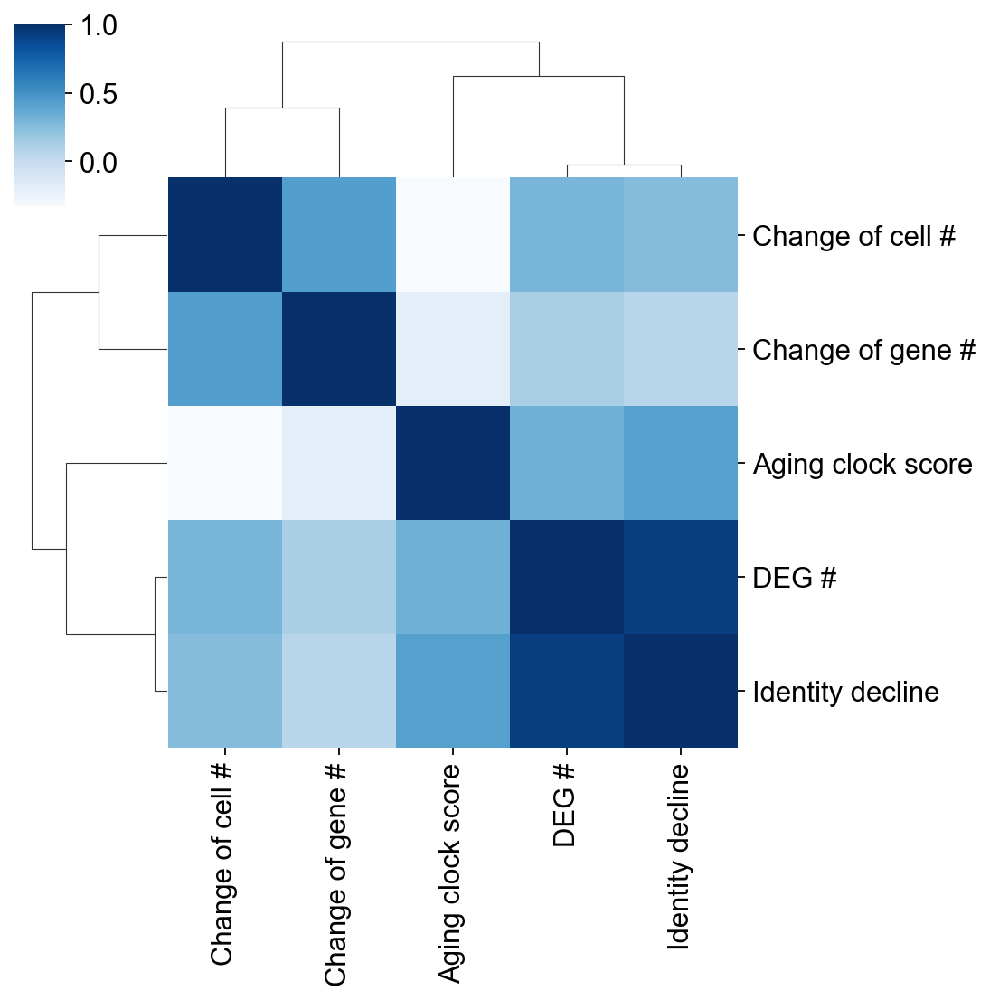

In [26]:
sns.clustermap(corr, figsize=(7,7), annot=False, cmap="Blues") # 
plt.savefig(f'{figure5PicFolder}/heatmap_agingFeature_correlation_noNum_Blues_12072022.pdf')
plt.show() 

## Rank of different aging features

In [27]:
aging_Df=pd.read_csv(f'{figure5Folder}/agingFeatures_12072022.csv', index_col=0)
aging_Df=abs(aging_Df)
aging_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score
adult alary muscle,1.332664,310,0.294399,0.2475,0.729
adult fat body_body,2.784070,3845,0.647621,0.5525,0.809
adult glial cell,0.495097,194,0.201802,0.1700,0.784
adult oenocyte,1.740676,1835,0.741369,0.5225,0.910
adult peripheral nervous system,0.733756,510,0.322585,0.2600,0.766
...,...,...,...,...,...
skeletal muscle of head,1.294277,1101,0.111846,0.5375,0.797
transmedullary Y neuron TmY5a,0.351287,328,0.189504,0.2525,0.837
transmedullary neuron Tm1,0.312016,433,0.276791,0.3250,0.847
transmedullary neuron Tm2,0.356349,417,0.332575,0.2975,0.846


In [28]:
rank_Df = pd.DataFrame(index=aging_Df.index.to_list(), columns=aging_Df.columns.to_list())

rank_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score
adult alary muscle,NaN,NaN,NaN,NaN,NaN
adult fat body_body,NaN,NaN,NaN,NaN,NaN
adult glial cell,NaN,NaN,NaN,NaN,NaN
adult oenocyte,NaN,NaN,NaN,NaN,NaN
adult peripheral nervous system,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
skeletal muscle of head,NaN,NaN,NaN,NaN,NaN
transmedullary Y neuron TmY5a,NaN,NaN,NaN,NaN,NaN
transmedullary neuron Tm1,NaN,NaN,NaN,NaN,NaN
transmedullary neuron Tm2,NaN,NaN,NaN,NaN,NaN


In [29]:
rank_D={}
for i, colName in enumerate(aging_Df.columns):
    rank_D[colName] = aging_Df.sort_values(by=aging_Df.columns[i]).index.to_list()
# rank_D

In [30]:
for i, colName in enumerate(rank_Df.columns):
    print(colName)
    annot_L=rank_D[colName]
    
    for j, annot in enumerate(rank_Df.index):
        # print(annot, annot_L.index(annot))
        rank_Df.iloc[j, i] = annot_L.index(annot)
        
    # print()

Change of cell #
DEG #
Change of gene #
Identity decline
Aging clock score


In [31]:
rank_Df['rank_Sum'] = rank_Df.sum(axis=1)

rank_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score,rank_Sum
adult alary muscle,55,14,45,14,1,129.0
adult fat body_body,63,63,61,58,22,267.0
adult glial cell,34,2,30,4,12,82.0
adult oenocyte,58,59,63,54,62,296.0
adult peripheral nervous system,42,33,50,18,8,151.0
...,...,...,...,...,...,...
skeletal muscle of head,54,52,16,57,16,195.0
transmedullary Y neuron TmY5a,26,16,26,17,39,124.0
transmedullary neuron Tm1,23,27,41,29,46,166.0
transmedullary neuron Tm2,27,25,53,23,45,173.0


In [32]:
rank_Df.sort_values(by='rank_Sum', inplace=True)

In [33]:
rank_Df=rank_Df.astype(int)
# rank_Df=rank_Df.iloc[::-1]

In [34]:
annot_broad_Df = pd.read_csv(f'{figureDataFolder}/science.abk2432_table s2_broadAnnot.csv')
annot_broad_Df.index = annot_broad_Df.Annotation
annot_broad_Df

,Annotation,Broad annotation,Cluster
Annotation,,,
adult antenna glial cell,adult antenna glial cell,glial cell,Tissues: antenna. This annotation was curated ...
"adult olfactory receptor neuron acid-sensing, Ir64a","adult olfactory receptor neuron acid-sensing, ...",sensory neuron,Tissues: antenna. This annotation was curated ...
"adult olfactory receptor neuron acid-sensing, Ir75a/b/c, Ir64a","adult olfactory receptor neuron acid-sensing, ...",sensory neuron,Tissues: antenna. This annotation was curated ...
"adult olfactory receptor neuron Ir56a+, Orco-","adult olfactory receptor neuron Ir56a+, Orco-",sensory neuron,Tissues: antenna. This annotation was curated ...
adult olfactory receptor neuron Ir75d,adult olfactory receptor neuron Ir75d,sensory neuron,Tissues: antenna. This annotation was curated ...
...,...,...,...
"btl-GAL4 positive female cell, likely to be ovary cell, sim+","btl-GAL4 positive female cell, likely to be ov...",female reproductive system,Tissues: trachea. This annotation was curated ...
"btl-GAL4 positive female cell, likely to be ovary cell, sim+, H15+","btl-GAL4 positive female cell, likely to be ov...",female reproductive system,Tissues: trachea. This annotation was curated ...
eye photoreceptor cell,eye photoreceptor cell,sensory neuron,Tissues: trachea. This annotation was curated ...


In [35]:
annot_broad_Df=annot_broad_Df.loc[ list(set([x.split('_')[0] for x in rank_Df.index.to_list()])), ['Annotation', 'Broad annotation']]

In [36]:
annot_broad_Df

,Annotation,Broad annotation
Annotation,,
lamina monopolar neuron L3,lamina monopolar neuron L3,CNS neuron
olfactory receptor neuron,olfactory receptor neuron,sensory neuron
adult ventral nervous system,adult ventral nervous system,CNS neuron
eo support cell,eo support cell,epithelial cell
Johnston organ neuron,Johnston organ neuron,sensory neuron
...,...,...
germline cell,germline cell,female germline cell
T neuron T4/T5c-d,T neuron T4/T5c-d,CNS neuron
auditory sensory neuron,auditory sensory neuron,sensory neuron


In [37]:
annot_broad_D = dict( zip(annot_broad_Df['Annotation'], annot_broad_Df['Broad annotation']))

# annot_broad_D

In [38]:
broadAnnot_L = [  annot_broad_D[x.split('_')[0]] for x in rank_Df.index ] # if x.split('_')[0] not in annot_broad_D.keys()

In [39]:
rank_Df['Broad annotation'] = broadAnnot_L
rank_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score,rank_Sum,Broad annotation
perineurial glial sheath,19,1,28,2,4,54,glial cell
alpha'/beta' Kenyon cell,22,15,7,8,9,61,CNS neuron
eo support cell,48,3,20,1,2,74,epithelial cell
T neuron T2a,5,9,29,13,19,75,CNS neuron
distal medullary amacrine neuron Dm8,30,7,21,6,13,77,CNS neuron
...,...,...,...,...,...,...,...
male accessory gland main cell,62,51,49,60,25,247,gland
adult fat body_body,63,63,61,58,22,267,fat cell
indirect flight muscle,60,49,52,61,49,271,muscle cell
pericerebral adult fat mass,59,54,56,63,52,284,fat cell


In [40]:
rank_Df['Neuron or glia'] = ['Neuron' if 'neuron' in x else 'glia' if 'glia' in x else 'Others' for x in rank_Df['Broad annotation']]
rank_Df

,Change of cell #,DEG #,Change of gene #,Identity decline,Aging clock score,rank_Sum,Broad annotation,Neuron or glia
perineurial glial sheath,19,1,28,2,4,54,glial cell,glia
alpha'/beta' Kenyon cell,22,15,7,8,9,61,CNS neuron,Neuron
eo support cell,48,3,20,1,2,74,epithelial cell,Others
T neuron T2a,5,9,29,13,19,75,CNS neuron,Neuron
distal medullary amacrine neuron Dm8,30,7,21,6,13,77,CNS neuron,Neuron
...,...,...,...,...,...,...,...,...
male accessory gland main cell,62,51,49,60,25,247,gland,Others
adult fat body_body,63,63,61,58,22,267,fat cell,Others
indirect flight muscle,60,49,52,61,49,271,muscle cell,Others
pericerebral adult fat mass,59,54,56,63,52,284,fat cell,Others


In [41]:
rank_Df['Broad annotation'].unique().tolist()

['glial cell',
 'CNS neuron',
 'epithelial cell',
 'sensory neuron',
 'female germline cell',
 'muscle cell',
 'hemocyte',
 'tracheal cell',
 'male reproductive system',
 'somatic precursor cell',
 'gland',
 'fat cell',
 'oenocyte']

In [ ]:
# "#A6CEE3", "#579BC7", "#3789AD", "#8DC594", "#87CA6A", "#3DA533", "#979C62", "#F98F8E", "#EB4445", "#E94330", "#F8A361", "#FDA440", "#FF7F00"
# "#A6CEE3", "#79B1D3", "#4C94C3", "#1F78B4", "#4F9AA6", "#80BC98", "#B2DF8A", "#87CA6A", "#5DB54B", "#33A02C", "#759E50", "#B89B74", "#FB9A99"
# "#1B9E77", "#897932", "#C8611F", "#8D6B86", "#9B58A5", "#DD2E8D", "#A66753", "#70A61B", "#BBA90B", "#D59D08", "#B07E18", "#8B6F3B", "#666666"

In [42]:
rank_Df.sort_values(by='rank_Sum', inplace=True, ascending=False)

In [44]:
lut = dict(zip(rank_Df['Broad annotation'].unique(), 
         ["#A6CEE3", "#579BC7", "#3789AD", "#8DC594", "#87CA6A", "#3DA533", "#979C62", "#F98F8E", "#EB4445", "#E94330", "#F8A361", "#FDA440", "#FF7F00"]))
row_colors = rank_Df['Broad annotation'].map(lut)

lut2 = dict(zip(rank_Df['Neuron or glia'].unique(), 
         list(sns.color_palette("Accent", 3)) ))
row_colors2 = rank_Df['Neuron or glia'].map(lut2)

color_Df = pd.concat([pd.DataFrame(row_colors),  pd.DataFrame(row_colors2)], axis=1)

In [45]:
from matplotlib.patches import Patch

In [46]:
handles = [Patch(facecolor=lut[name]) for name in lut]
handles2 = [Patch(facecolor=lut2[name]) for name in lut2]
# handles

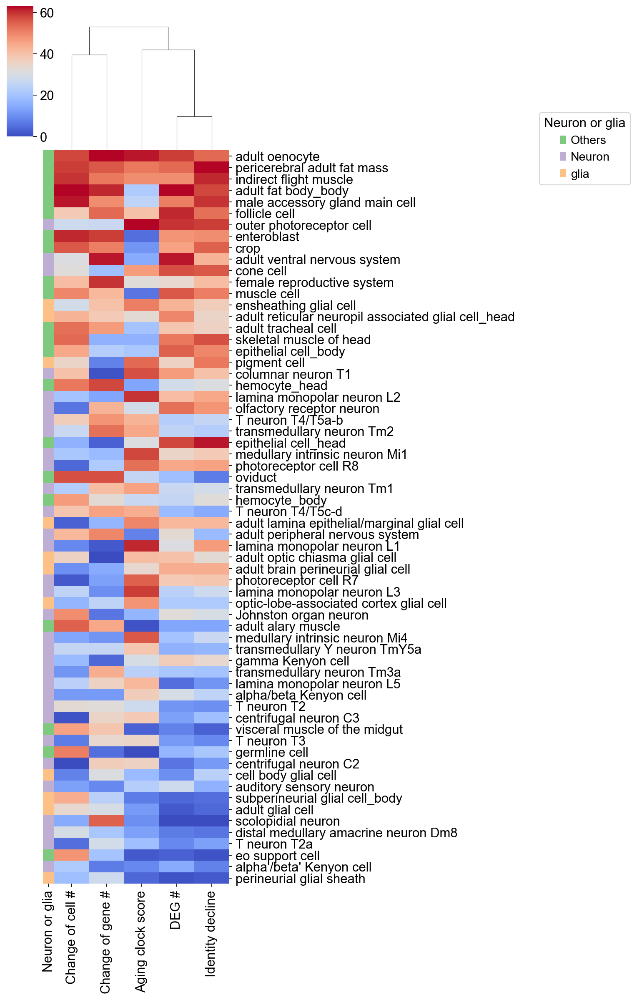

In [47]:
with rc_context({'figure.figsize': (5, 16)}):
    # sns.heatmap(data=rank_Df.iloc[:,:-1], cmap='coolwarm', yticklabels=True)
    # fig, ax = plt.subplots(figsize=(8, 15))
    g=sns.clustermap(data=rank_Df.iloc[:,:-3], cmap='coolwarm', figsize=(8, 15), yticklabels=True, row_cluster=False,  dendrogram_ratio=0.15, 
                   colors_ratio=0.05, row_colors=row_colors2, cbar_pos=(0.02, 0.87, 0.05, 0.13)) # 
    

    # legend1=plt.legend(handles, lut, title='Broad annotation', bbox_to_anchor=(1.2, 0.7), bbox_transform=plt.gcf().transFigure)
    # ax.add_artist(legend1)
    
    # plt.legend(handles, lut, title='Broad annotation',
    #        bbox_to_anchor=(1.2, 0.7), bbox_transform=plt.gcf().transFigure) # , loc='upper right'
    plt.legend(handles2, lut2, title='Neuron or glia',
           bbox_to_anchor=(1.2, 0.9), bbox_transform=plt.gcf().transFigure)
    
    # plt.savefig(f'{figure5PicFolder}/agingFeature_rank_all.pdf', bbox_inches='tight')
    plt.savefig(f'{figure5PicFolder}/agingFeature_rank_all_12072022.pdf', bbox_inches='tight')
    plt.show()

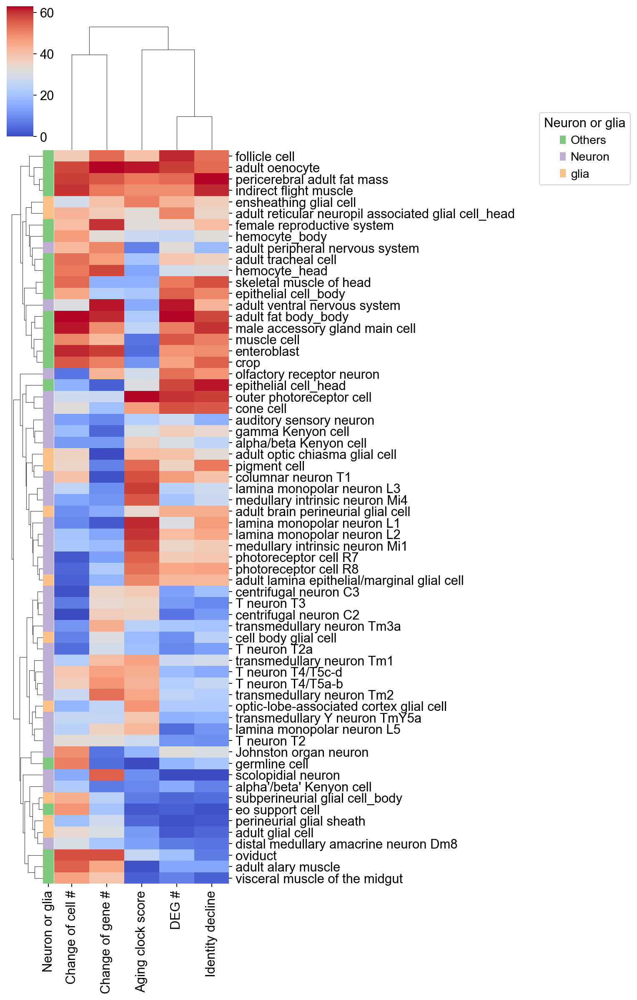

In [48]:
with rc_context({'figure.figsize': (5, 16)}):
    # sns.heatmap(data=rank_Df.iloc[:,:-1], cmap='coolwarm', yticklabels=True)
    sns.clustermap(data=rank_Df.iloc[:,:-3], cmap='coolwarm', yticklabels=True, row_cluster=True, figsize=(8, 15), dendrogram_ratio=0.15, 
                   colors_ratio=0.05, row_colors=row_colors2, cbar_pos=(0.02, 0.87, 0.05, 0.13)) # 
    # plt.legend(handles, lut, title='Broad annotation',
    #        bbox_to_anchor=(1.2, 0.7), bbox_transform=plt.gcf().transFigure) # , loc='upper right'
    plt.legend(handles2, lut2, title='Neuron or glia',
           bbox_to_anchor=(1.2, 0.9), bbox_transform=plt.gcf().transFigure)
    plt.savefig(f'{figure5PicFolder}/agingFeature_rank_all_rowCluster_12072022.pdf', bbox_inches='tight')
    plt.show()